In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2 

import scipy
import numpy as np 
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib as mpl
import warnings
warnings.filterwarnings('ignore')

from npyx import extract_rawChunk, get_npix_sync
from npyx.gl import get_units
# from npyx.plot import plot_raw, plot_raw_units, raster_plot,psth_plot
from npyx.spk_t import trn
# from npyx.plot import plot_ccg, plot_acg, plot_wvf, plt_acg, plot_raw_units#, plot_ifr
# from npyx.spk_wvf import wvf, get_peak_chan, get_depthSort_peakChans
# from npyx.spk_wvf import wvf
# from npyx.behav import get_processed_ifr
# from npyx.spk_t import mfr, isi, ids
from scipy.signal import chirp, find_peaks, peak_widths
from npyx import chan_map
from npyx.circuitProphyler import Prophyler
from scipy import stats
import os
from os import walk
from ast import literal_eval
from scipy import interpolate
from scipy.interpolate import interp1d
import re 
import matplotlib
import scipy.io as sio
import scipy.signal
# from scipy import *
import copy
from numpy import linspace
from copy import deepcopy
import random
#import more_itertools as mit
from numba import jit
from sklearn.model_selection import train_test_split
from sklearn import svm
from sklearn import metrics
from sklearn.metrics import plot_confusion_matrix

from npyx.corr import crosscorrelate_cyrille
from sklearn.metrics import confusion_matrix

from scipy.ndimage import gaussian_filter

from scipy import io
from scipy import stats
import sys
import pickle

from scipy import signal
from scipy.signal import butter, lfilter, hilbert

from scipy.ndimage import gaussian_filter
from scipy.signal import find_peaks

 
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import numpy as np
from numpy import genfromtxt
from numpy.linalg import norm
import pandas as pd
from numba import jit

from heapq import nsmallest
from scipy.signal import chirp, find_peaks, peak_widths
from scipy.ndimage import gaussian_filter1d

from os import walk
from ast import literal_eval
import re 
import scipy
from scipy.ndimage import gaussian_filter
# import more_itertools as mit
import random
from datetime import date

import xml.etree.ElementTree as ET

# start_time = datetime.now().strftime("%H:%M:%S")
# Date = date.today.strftime("%d%m%Y")

from scipy.spatial.distance import pdist, squareform
from scipy.stats import zscore, bootstrap, sem
from scipy.signal import savgol_filter as sg_filter
from scipy.signal import gaussian
from scipy.ndimage import gaussian_filter1d
from scipy.stats import wilcoxon, pearsonr
from scipy import stats
from scipy.optimize import minimize
# from sklearn.prepocessing import normalize

import copy
from sklearn.neighbors import KernelDensity
from sklearn.decomposition import FastICA
from sklearn.decomposition import PCA
from statsmodels.stats.weightstats import ztest


npyx version 2.3.4 imported.


In [2]:
def flatten_list(t):
    return [item for sublist in t for item in sublist]
def grab_file_info(dp): 
    """ This function gets the relevant information of a file from the name 
        
        Parameters: datapath 

        Returns: Mouse_ID, Date

    """ 
    f = []
    for (dirpath, dirnames, filenames) in walk(dp):
        f.extend(filenames)
        break
    Mouse_ID = f[0].split('.')[0][6:9]
    Date = f[0].split('.')[0][:6]
    return Mouse_ID, Date
def sorted_nicely( l ): 
    """ Sort the given iterable in the way that humans expect.""" 
    convert = lambda text: int(text) if text.isdigit() else text 
    alphanum_key = lambda key: [ convert(c) for c in re.split('([0-9]+)', key) ] 
    return sorted(l, key = alphanum_key)

def behaviour_trial_function_1Map(data, start_trial):
    
    
    behav_trial_lengths = [len(i) for i in data[start_trial:]]
    behav_trials = []
    for i in data[start_trial:]: 
        this_trial = i
        this_trial_list = []
        for u in this_trial: 
            this_trial_list.append(u[0])
        behav_trials.append(this_trial_list)
        
    return behav_trial_lengths, behav_trials

def get_imaging_trial_lengths(Triggers):
    
    img_trial_lengths = []
    for idx, i in enumerate(Triggers[:-1]):
        img_trial_lengths.append(Triggers[idx+1] - Triggers[idx])
        
    return img_trial_lengths

def re_sample_behaviour(behav_trials, img_trial_lengths, y_start, y_end): 
    re_sampled_behav = []
    for idx, i in enumerate(behav_trials): 
        re_sample = scipy.signal.resample(i, img_trial_lengths[idx])
        re_sample[re_sample < y_start] = y_start
        re_sample[re_sample > y_end] = y_end
        re_sample[0:10], re_sample[-10:] = y_start, y_end
        re_sampled_behav.append(re_sample)
    return re_sampled_behav

def re_sample_speed(behav_trials, img_trial_lengths): 
    re_sampled_behav = []
    for idx, i in enumerate(behav_trials): 
        re_sample = scipy.signal.resample(i, img_trial_lengths[idx])
#         re_sample[re_sample < y_start] = y_start
#         re_sample[re_sample > y_end] = y_end
#         re_sample[0:10], re_sample[-10:] = y_start, y_end
        re_sampled_behav.append(re_sample)
    return re_sampled_behav

def normalizedata(data):
    return (data - np.min(data)) / (np.max(data) - np.min(data))

@jit(nopython=True)
def interpolation(arr_3d,):
    result=np.zeros_like(arr_3d)
    for i in range(arr_3d.shape[0]):
        for j in range(arr_3d.shape[1]):
            arr=arr_3d[i,j,:]
            # If all elements are nan then cannot conduct linear interpolation.
            if np.sum(np.isnan(arr))==arr.shape[0]:
                result[i,j,:]=arr
            else:
                # If the first elemet is nan, then assign the value of its right nearest neighbor to it.
                if np.isnan(arr[0]):
                    arr[0]=arr[~np.isnan(arr)][0]
                # If the last element is nan, then assign the value of its left nearest neighbor to it.
                if np.isnan(arr[-1]):
                    arr[-1]=arr[~np.isnan(arr)][-1]
                # If the element is in the middle and its value is nan, do linear interpolation using neighbor values.
                for k in range(arr.shape[0]):
                    if np.isnan(arr[k]):
                        x=k
                        x1=x-1
                        x2=x+1
                        # Find left neighbor whose value is not nan.
                        while x1>=0:
                            if np.isnan(arr[x1]):
                                x1=x1-1
                            else:
                                y1=arr[x1]
                                break
                        # Find right neighbor whose value is not nan.
                        while x2<arr.shape[0]:
                            if np.isnan(arr[x2]):
                                x2=x2+1
                            else:
                                y2=arr[x2]
                                break
                        # Calculate the slope and intercept determined by the left and right neighbors.
                        slope=(y2-y1)/(x2-x1)
                        intercept=y1-slope*x1
                        # Linear interpolation and assignment.
                        y=slope*x+intercept
                        arr[x]=y
                result[i,j,:]=arr
    return result

def behaviour_pre_processing(dp_behav, StimFs, y_start, y_end): 
    os.chdir(dp_behav)
    Mouse_ID, Date = grab_file_info(dp_behav)
    behaviour_data = fully_sorted_data(dp_behav, Date)    
    behav_trial_lengths, behav_trials = behaviour_trial_function_1Map(behaviour_data, 1)
    img_trial_lengths = get_imaging_trial_lengths(StimFs)
    re_sampled_behav = re_sample_behaviour(behav_trials, img_trial_lengths, y_start, y_end)

    behav_speed = []
    for t in behav_trials:
        speed_list = []
        for i in range(20,len(t)):
            speed_list.append((np.max(t[i-20:i])-np.min(t[i-20:i]))*0.5/(20/55))
        speed_list = [speed_list[0]]*20 + speed_list
        behav_speed.append(speed_list)
    re_sampled_speed = re_sample_speed(behav_speed, img_trial_lengths)


    return re_sampled_behav, re_sampled_speed, behav_trial_lengths

def fully_sorted_data(dp_behav, Date):
    os.chdir(dp_behav)
    file_names = [i for i in os.listdir(dp_behav) if os.path.isfile(os.path.join(dp_behav,i)) and Date in i[:6]]
    file_names2 = []
    for x in sorted_nicely(file_names):
        file_names2.append(x)
    data  = []
    for i in file_names2:
        with open(i, 'r') as f:
            this_data = literal_eval('[' + ''.join(f.readlines()) + ']')
        data.append(this_data[0])
    return data 


#PLACE CELL FUNCTIONS 

def new_rate_map(traces, speed, y_start, y_end, binsize, triggers, trial_n, re_sampled_behav):
    tracesc = np.array(traces, copy=True)  
    bins = np.arange(y_start, y_end+binsize, binsize)
    master = np.zeros([len(trial_n), len(tracesc), len(bins)] )
    for tdx, t in enumerate(trial_n): 
        bt = re_sampled_behav[t]
        st = speed[t]
        tt = tracesc[:,triggers[t]:triggers[t+1]]
        dig = np.digitize(bt,bins)
        tt[:, np.where(st < 5)[0]] = np.nan
        master[tdx] = np.array([tt[:,dig == i].mean(axis=1) for i in range(0,len(bins))]).transpose()
    return interpolation(master)

def new_rate_map_shuffle(traces, speed, y_start, y_end, binsize, triggers, trial_n, re_sampled_behav):
    tracesc = np.array(traces, copy=True)  
    bins = np.arange(y_start, y_end+binsize, binsize)
    master = np.zeros([len(trial_n), len(tracesc), len(bins)] )
    for tdx, t in enumerate(trial_n): 
        bt = re_sampled_behav[t]
        st = speed[t]
        tt = np.roll(tracesc[:,triggers[t]:triggers[t+1]], random.randint(5*30, 100000))
        dig = np.digitize(bt,bins)
        tt[:, np.where(st < 5)[0]] = np.nan
        master[tdx] = np.array([tt[:,dig == i].mean(axis=1) for i in range(0,len(bins))]).transpose()
    return interpolation(master)

def peaksort(alist):
    return np.argmax(alist)

def place_cell_dombeck(trace):
    #trace = gaussian_filter(Map1_mean_traces[221],sigma = 3)
    max_bins = 80
    min_bins = 4
    df_thresh = 0.1

#     trace = trace-np.min(trace)
    peak = np.max(trace)
    minn = np.median(sorted(trace)[:int(len(trace)/4)])
    greater_indicies = [udx for udx, u in enumerate(trace) if u > (peak-minn)/4]
    fields = [list(group) for group in mit.consecutive_groups(greater_indicies)]
    big_enough_fields = [i for i in fields if max_bins >len(i) > min_bins]
    percent_20 = []
    for i in big_enough_fields: 
        if len([c for c in [trace[u] for u in i] if c > df_thresh]) > 1: 
            percent_20.append(i)
    thresholded_field = []
    for i in percent_20: 
        if np.mean([trace[u] for u in i]) > np.mean([c for cdx, c in enumerate(trace) if cdx not in i])*3: 
            thresholded_field.append(i)
    return thresholded_field

def calculate_map_stability(rate_map): 
    corr = []
    for idx, i in enumerate(rate_map): 
        remaing = rate_map[(np.arange(rate_map.shape[0]) != idx),:]
        corr.append(np.corrcoef(i, np.mean(remaing,axis=0))[1,0])
    return np.mean(corr)

def my_z_score(dist, value):
    mean = np.mean(dist)
    std = np.std(dist)
    return (value-mean)/std

def my_place_cell_func(smoothed_trace, shuffled_peaks): 
    return my_z_score(shuffled_peaks,np.max(smoothed_trace))


def calculate_map_stability(rate_map, Sigma): 
    corr = []
    for idx, i in enumerate(rate_map): 
        remaing = rate_map[(np.arange(rate_map.shape[0]) != idx),:]
        corr.append(np.corrcoef(gaussian_filter(i,sigma = Sigma), gaussian_filter(np.mean(remaing,axis=0),sigma = Sigma))[1,0])
    return corr

def FWHM(X,Y):
    half_max = max(Y) / 2
    #find when function crosses line half_max (when sign of diff flips)
    #take the 'derivative' of signum(half_max - Y[])
    d = np.sign(half_max - np.array(Y[0:-1])) - np.sign(half_max - np.array(Y[1:]))
    #plot(X[0:len(d)],d) #if you are interested
    #find the left and right most indexes
    left_idx = np.where(d > 0)[0]
    right_idx = np.where(d < 0)[-1]
    return left_idx,right_idx # X[right_idx], X[left_idx] #return the difference (full width)

def PC_FWHM_field_width(trace):
    bsl = np.median(sorted(trace)[:int(len(trace)/5)]) #median of 20% lowest values
    trace = trace - bsl
    r_trace = trace[::-1]
    try: 
        r = np.argmax(trace) + next(xdx for xdx, x in enumerate(trace[np.argmax(trace):]) if x < np.max(trace)/2)
    except: r = 200
    try:
        l = np.argmax(trace) - next(xdx for xdx, x in enumerate(r_trace[np.argmax(r_trace):]) if x < np.max(trace)/2)
    except: l = 0
    return r-l


def bin_spikes(spike_times,dt,wdw_start,wdw_end):
    """
    Function that puts spikes into bins
    Parameters
    ----------
    spike_times: an array of arrays
        an array of neurons. within each neuron's array is an array containing all the spike times of that neuron
    dt: number (any format)
        size of time bins
    wdw_start: number (any format)
        the start time for putting spikes in bins
    wdw_end: number (any format)
        the end time for putting spikes in bins
    Returns
    -------
    neural_data: a matrix of size "number of time bins" x "number of neurons"
        the number of spikes in each time bin for each neuron
    """
    edges=np.arange(wdw_start,wdw_end,dt) #Get edges of time bins
    num_bins=edges.shape[0]-1 #Number of bins
    num_neurons=spike_times.shape[0] #Number of neurons
    neural_data=np.empty([num_bins,num_neurons]) #Initialize array for binned neural data
    #Count number of spikes in each bin for each neuron, and put in array
    for i in range(num_neurons):
        neural_data[:,i]=np.histogram(spike_times[i],edges)[0]
    return neural_data

def generate_binned_data(trains,bin_size, start, end):
    my_spike_times = np.array([i/30000 for i in trains]) 

    my_dt=bin_size #Size of time bins (in seconds)
    my_t_start=start #Time to start extracting data - here the first time position was recorded
    my_t_end=end
    my_downsample_factor=1

    my_spike_times=np.squeeze(my_spike_times)
    for i in range(my_spike_times.shape[0]):
        my_spike_times[i]=np.squeeze(my_spike_times[i])
    my_neural_data=bin_spikes(my_spike_times,my_dt,my_t_start,my_t_end)
    
    return my_neural_data


def butter_bandpass(lowcut, highcut, fs, order):
    return butter(order, [lowcut, highcut], fs=fs, btype='band')

def butter_bandpass_filter(data, lowcut, highcut, fs, order, padlen):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = signal.filtfilt(b, a, data, padtype='even', padlen=padlen)
    return y
def filter_and_angle(inp, lowcut, highcut, fs, order, padlen):

    s = butter_bandpass_filter(inp, lowcut, highcut, fs, order, padlen)
    t = np.arange(0, len(s), 1)
    analytic_signal = hilbert(s)
    amplitude_envelope = np.abs(analytic_signal)
    instantaneous_phase = np.unwrap(np.angle(analytic_signal))
    instantaneous_frequency = (np.diff(instantaneous_phase) / (2.0*np.pi) * fs)
    theta_phase_188_cos = np.cos(instantaneous_phase)
    theta_phase = np.angle(analytic_signal, deg = True)
    return s, theta_phase

def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return array[idx]


In [3]:
def normalize(x):
    '''
    normalize a vector x
    
    Input:
    x: numpy.ndarry shape: (n, )
    '''
    return (x-np.min(x))/(np.max(x)-np.min(x))

def first_index(x, y, condition='>', order='forward'): 
    '''
    get the first index that meets the condition
    
    Inputs:
    x: numpy.ndarry shape: (n, )
    y: numpy.ndarry shape: (n, )
    condition: should be one of '>','>=','<','<=','=='
    order: choose from 'forward' and 'backward', the order we look through the array
    '''
    
    if order == 'forward':
        for i in range(len(x)):
            if condition == '>':
                if x[i] > y[i]:
                    return i
            elif condition == '>=':
                if x[i] >= y[i]:
                    return i
            elif condition == '<':
                if x[i] < y[i]:
                    return i
            elif condition == '<=':
                if x[i] <= y[i]:
                    return i
            else:
                if x[i] == y[i]:
                    return i
        return len(x)-1
    else:
        for i in range(len(x)-1, -1, -1):
            if condition == '>':
                if x[i] > y[i]:
                    return i
            elif condition == '>=':
                if x[i] >= y[i]:
                    return i
            elif condition == '<':
                if x[i] < y[i]:
                    return i
            elif condition == '<=':
                if x[i] <= y[i]:
                    return i
            else:
                if x[i] == y[i]:
                    return i
        return 0



### Assembly analysis

In [4]:
# Defining some functions
def mpPDF(var, q, pts):
    """
    Creates a Marchenko-Pastur Probability Density Function

    Input
    ----------
    var: Variance (float)
    q: T/N where T is the number of rows and N the number of columns (n_neurons/n_samples)
    pts: int for the number of points used to build PDF
    Returns
    -------
    pandas series Marchenko-Pastur PDF

    Source
    ------
    Adapted from https://medium.com/swlh/an-empirical-view-of-marchenko-pastur-theorem-1f564af5603d

    Ref
    ---
    Marchenko and Pastur 1967 - https://www.researchgate.net/publication/303008084_Distribution_of_eigenvalues_for_some_sets_of_random_matrices
    """
    # Marchenko-Pastur pdf
    # q=T/N
    # Adjusting code to work with 1 dimension arrays
    if isinstance(var, np.ndarray):
        if var.shape == (1,):
            var = var[0]
    eMin, eMax = var * (1 - (1. / q) ** .5) ** 2, var * (1 + (1. / q) ** .5) ** 2
    eVal = np.linspace(eMin, eMax, pts)
    pdf = q / (2 * np.pi * var * eVal) * ((eMax - eVal) * (eVal - eMin)) ** .5
    pdf = pd.Series(pdf, index=eVal)
    return pdf


def fitKDE(obs, bWidth=.25, kernel='gaussian', x=None):
    """
    Fit kernel to a series of obs, and derive the prob of obs x is the array of values
        on which the fit KDE will be evaluated. It is the empirical PDF

    Input
    ----------
    obs: array of observations to fit (eigenvalues)
    bWidth: The bandwidth of the kernel (0.25 default)
    kernel: string of which kerne to use ([‘gaussian’|’tophat’|’epanechnikov’|’exponential’|’linear’|’cosine’]), ('gaussian' default)
    x: array of values on which fit KDE is evaluated
    Returns
    -------
    pandas series Emperical PDF

    Source
    ------
    Adapted from https://medium.com/swlh/an-empirical-view-of-marchenko-pastur-theorem-1f564af5603d

    Ref
    ---
    Marchenko and Pastur 1967 - https://www.researchgate.net/publication/303008084_Distribution_of_eigenvalues_for_some_sets_of_random_matrices
    """

    if len(obs.shape) == 1:
        obs = obs.reshape(-1, 1)
    kde = KernelDensity(kernel=kernel, bandwidth=bWidth).fit(obs)
    if x is None:
        x = np.unique(obs).reshape(-1, 1)
    if len(x.shape) == 1:
        x = x.reshape(-1, 1)
    logProb = kde.score_samples(x)  # log(density)
    pdf = pd.Series(np.exp(logProb), index=x.flatten())
    return pdf


def errPDFs(var, eVal, q, bWidth, pts=1000):
    """
    Fit error of Empirical PDF (uses Marchenko-Pastur PDF)

    Input
    ----------
    var: Variance (float)
    eVal: array of eigenvalues
    q: T/N where T is the number of rows and N the number of columns (n_neurons/n_samples)
    bWidth: The bandwidth of the kernel
    pts: int for the number of points used to build PDF
    Returns
    -------
    A float that is the sum squared error

    Source
    ------
    Adapted from https://medium.com/swlh/an-empirical-view-of-marchenko-pastur-theorem-1f564af5603d

    Ref
    ---
    Marchenko and Pastur 1967 - https://www.researchgate.net/publication/303008084_Distribution_of_eigenvalues_for_some_sets_of_random_matrices
    """

    # Fit error
    pdf0 = mpPDF(var, q, pts)  # theoretical pdf
    pdf1 = fitKDE(eVal, bWidth, x=pdf0.index.values)  # empirical pdf
    sse = np.sum((pdf1 - pdf0) ** 2)
    return sse


def findMaxEval(eVal, q, bWidth):
    """
    Finds max random eigenvalue by fitting Marchenko’s dist (i.e) everything else larger than
        this, is a signal eigenvalue

    Input
    ----------
    eVal: array of eigenvalues to fit
    q: T/N where T is the number of rows and N the number of columns (n_neurons/n_samples)
    bWidth: The bandwidth of the kernel

    Returns
    -------
    Tuple containing eMax - (max eigenvalue for random eigenvalues) and var - variance attributed to noise

    Source
    ------
    Adapted from https://medium.com/swlh/an-empirical-view-of-marchenko-pastur-theorem-1f564af5603d

    Ref
    ---
    Marchenko and Pastur 1967 - https://www.researchgate.net/publication/303008084_Distribution_of_eigenvalues_for_some_sets_of_random_matrices
    """

    out = minimize(lambda *x: errPDFs(*x), .5, args=(eVal, q, bWidth),
                   bounds=((1E-5, 1 - 1E-5),))
    if out['success']:
        var = out['x'][0]
    else:
        var = 1
    eMax = var * (1 + (1. / q) ** .5) ** 2
    return eMax, var

def EB_assembly_analysis(data):
    # How to use

    #1) Create spike matrix 

    bin_size = 0.025 #in seconds 

    # bin_size=0.025
    matrix = binning(data, 25) #deconvolved data #this is the normal spike matrix (np.array with shape(neurons,time bins))
    print('binning finished')
    matrix = gaussian_filter1d(matrix, sigma=1)
    print('Smoothing finished')
    #we can consider smoothing it 
#     s_matrix = np.zeros_like(matrix)
#     for i in range(matrix.shape[0]): 
#         s_matrix[i] = gaussian_filter1d(matrix[i], sigma = 1)
    #if you'd like to use the smoothed one just change matrix to s_matrix (or assign matrix as s_matrix)

    #Next z-score such that we have null-mean and unity-variance 
    z_matrix = stats.zscore(matrix, axis=1) #this is the z-scored spike matrix (z-scoring is on full matrix on purpose! - relative to baseline would require different math)
    print('zscore finished')
    covariance_matrix = np.cov(z_matrix) #this is the covariance matrix


    #2) Find number of cell assemblies using Marchenko Pastur Theorem

    # Getting Eigenvalues and Eigenvectors
    eig_vals, eig_vecs = np.linalg.eig(covariance_matrix) ####
    print('Got eigenvalues and eigenvectors')
    #determining q -> Ncol/NRow of spike matrix for estimating Randomness using Marchenko-Pastur
    q = z_matrix.shape[1]/z_matrix.shape[0]

    # Getting Max Eigenvalues and calculating variance attributed to noise
    eMax0, var0 = findMaxEval(eig_vals, q, bWidth=0.01)

    #determining number of significant assemblies 
    sig_eigs = eig_vals[np.where(eig_vals > eMax0)]
    print('Got number of significant assemblies')
    
    #3) Extraction of cell assembly patterns and estimation of cell assembly activity

    X = z_matrix #just assigning matrix to new variable in case ICA transforms the array 

    #Lopes dos Santos et al. 2013 says to first reduce PCA and run ICA in that reduced space.
    #I tried that and it gives essentially the same result but sometimes inversts the sign of the weight. 
    #I suspect that the sklearn ICA function already factors this in when you give it the number of components to pull out. 
    #So I just run ICA straight as it seems to give me reasonable results

    # #uncomment if like to run PCA first 
    # pca = PCA(n_components=len(sig_eigs), svd_solver='arpack', random_state=101)
    # X = pca.fit_transform(X)

    #we run fastICA (Hyvarinen and Oja 2000 - implemented by sklearn A. Hyvarinen and E. Oja, Independent Component Analysis: Algorithms and Applications, Neural Networks, 13(4-5), 2000, pp. 411-430.) 
    #this attributes wieghts to each neuron for the number of determined cell assemblies 
    transformer = FastICA(n_components=len(sig_eigs), whiten=True, random_state=101) 
    X_transformed = transformer.fit_transform(X) 
    print('fastICA finished')

#     #Next we calculate the assembly strength by multiplying the spike matrix by each neuron's ICA weight for each assembly pattern
#     #We then sum these products to obtain the time resolved activation strength for each assembly
#     assembly_strength = np.zeros((X_transformed.shape[1], z_matrix.shape[1])) #this will be time resolved assembly strength (np.array with shape(assemblies, time_bins))
#     for i in range(X_transformed.shape[1]): #there is probably a better way to code this but fuck it 
#         weighted = (z_matrix.transpose()*X_transformed[:,i]).transpose()
#         assembly_strength[i] = np.sum(weighted, axis=0)
    
    assembly_strength = reactivation_strength(X_transformed, z_matrix)
    print('Computed assembly strength')
    
    fig = plt.figure(figsize=(12, 8))
    gs = fig.add_gridspec(2, 2)
    ax1 = fig.add_subplot(gs[0, 0], )
    ax2 = fig.add_subplot(gs[0, 1], )
    ax3 = fig.add_subplot(gs[1, 0], )
    ax4 = fig.add_subplot(gs[1, 1], )

    show_z = np.zeros(z_matrix.shape)
    for i in range(show_z.shape[0]):
        show_z[i, :] = normalize(z_matrix[i, :])
    im = ax1.imshow(show_z, aspect='auto', interpolation='None', cmap='cividis')
    ax1.set_title('Z-scored Spike Matrix' , fontsize=20)
    ax1.set_ylabel('Neuron', fontsize=15)
    ax1.set_xlabel('Time(0.025s bins)', fontsize=15)
    cbar = plt.colorbar(im, ax=ax1, )
    cbar.ax.set_ylabel('Nomalized(Z score)', fontsize=15)

    im = ax2.imshow(covariance_matrix, aspect='auto', interpolation='None', cmap='cividis')
    ax2.set_title('Covariance Matrix' , fontsize=20)
    ax2.set_ylabel('Neuron', fontsize=15)
    ax2.set_xlabel('Neuron', fontsize=15)
    cbar = plt.colorbar(im, ax=ax2, )
    cbar.ax.set_ylabel('Covariance', fontsize=15)

    x = np.arange(0, np.max(eig_vals)+1, 0.2)
    eigs = np.zeros(x.shape)
    for k in eig_vals:
        eigs[int(k/0.2)] += 1
    eigs /= np.sum(eigs)
    ax3.bar(x, eigs, color='orange', label='empirical data')
    ax3.plot(np.ones(100)*(1+np.sqrt(1/q))**2, np.linspace(0, 0.3, 100), linestyle='--', label='max lamda')
    ax3.legend()
    ax3.set_title('Marchenko-Pastur Theorem' , fontsize=20)
    ax3.set_xlabel('\lambda', fontsize=15)
    ax3.set_ylabel('prob[\lambda]', fontsize=15)
    
    im = ax4.imshow(X_transformed.T, aspect='auto', interpolation='None', cmap='cividis')
    ax4.set_title('Assembly Contribution' , fontsize=20)
    ax4.set_xlabel('Neuron', fontsize=15)
    ax4.set_ylabel('Assembly', fontsize=15)
    cbar = plt.colorbar(im, ax=ax4, )
    cbar.ax.set_ylabel('ICA weight', fontsize=15)
    
    
    ## spike train from Spks_behav
    ## Spks_behav

    #plot assembly 

    one = 0
    two = 1
    three = 2

    window = np.argmax(assembly_strength[0,:])
    size = 100

    df = pd.DataFrame(X_transformed)
    res = pd.DataFrame(df.values.argsort(0), columns=df.columns)\
            .iloc[len(df.index): -4: -1]
    color_seq = [0]*len(matrix)
    for udx, u in enumerate(matrix): 
        if udx in np.array(res.iloc[:,one]): 
            color_seq[udx] = 'C0'
        elif udx in np.array(res.iloc[:,two]): 
            color_seq[udx] = 'C1'
        elif udx in np.array(res.iloc[:,three]): 
            color_seq[udx] = 'C2'
        else:
            color_seq[udx] = 'gray'
        
    fig = plt.figure(figsize = (8,8))

    gs = fig.add_gridspec(3,3)
    ax2 = fig.add_subplot(gs[2, :2],)
    ax1 = fig.add_subplot(gs[:2, :2], sharex=ax2)

    plt.subplots_adjust(wspace=0.3, hspace=0.3)


    ax5 = fig.add_subplot(gs[2, 2],)
    ax3 = fig.add_subplot(gs[0, 2],sharex = ax5, sharey=ax5)
    ax4 = fig.add_subplot(gs[1, 2],sharex = ax5, sharey=ax5)
    



    for udx, u in enumerate(matrix):
        ax1.scatter([idx for idx, i in enumerate(matrix[udx,window-size:window+size]) if i > 0], [udx]*len([idx for idx, i in enumerate(matrix[udx,window-size:window+size]) if i > 0]), s = 3, color = color_seq[udx])

    ax2.plot(assembly_strength[one,window-size:window+size])
    ax2.plot(assembly_strength[two,window-size:window+size])
    ax2.plot(assembly_strength[three,window-size:window+size])

    ax3.hlines(y=[i+1 for i in range(len(X_transformed[:,one]))], xmin=0, xmax=[i for i in X_transformed[:,one]], color='C0', alpha = 0.7)
    ax3.plot([i for i in X_transformed[:,one]], range(len(X_transformed)) , "o", color = 'C0', markersize = 3)

    ax4.hlines(y=[i+1 for i in range(len(X_transformed[:,two]))], xmin=0, xmax=[i for i in X_transformed[:,two]], color='C1', alpha = 0.7)
    ax4.plot([i for i in X_transformed[:,two]], range(len(X_transformed)), "o", color = 'C1', markersize = 3)

    ax5.hlines(y=[i+1 for i in range(len(X_transformed[:,three]))], xmin=0, xmax=[i for i in X_transformed[:,three]], color='C2', alpha = 0.7)
    ax5.plot([i for i in X_transformed[:,three]], range(len(X_transformed)), "o", color = 'C2', markersize = 3)

    ax5.set_xlim(-1,1)

    # ax5.set_xticklabels(np.arange(-1,1.5,0.5))

    plt.setp(ax1.get_xticklabels(), visible=False)
    plt.setp(ax3.get_xticklabels(), visible=False)
    plt.setp(ax4.get_xticklabels(), visible=False)

    ax5.set_yticks(np.arange(0,25,5))
    ax1.set_yticks(np.arange(0,25,5))


    ax1.set_ylabel('Neuron', fontsize = 10)
    ax2.set_ylabel('Assembly \n Strength (z)', fontsize = 10)
    ax2.set_xlabel('Time ({} s bins)'.format(bin_size), fontsize = 10)

    ax3.set_ylabel('Neuron', fontsize = 10)
    ax4.set_ylabel('Neuron', fontsize = 10)
    ax5.set_ylabel('Neuron', fontsize = 10)


    ax3.set_title('Assembly 1', fontsize = 10)
    ax4.set_title('Assembly 2', fontsize = 10)
    ax5.set_title('Assembly 3', fontsize = 10)

    plt.show()
    
    return X_transformed, assembly_strength

def binning(data, nbins):
    '''
    bin data
    data:[cells, activity]
    '''
    bin_num = int(data.shape[1]/nbins)
    binned = np.zeros((data.shape[0], bin_num))
    for k in range(bin_num):
        binned[:, k] = np.sum(data[:, k*nbins:(k+1)*nbins], axis=1)
    return binned

In [5]:
### Grosmark 

def reactivation_strength(ICA_matrix, activity_matrix):
    '''
    Compute reactivation strength matrix
    
    ICA_matrix: [cell_id, assembly_id] weights
    activity_matrix: [cell_id, frames] dF/F
    '''
    cell_num, assem_num = ICA_matrix.shape
    R = np.zeros((assem_num, activity_matrix.shape[1]))  ## reactivation strength
    for i in range(ICA_matrix.shape[1]): #there is probably a better way to code this but fuck it 
        weighted = (activity_matrix.transpose()*ICA_matrix[:,i]).transpose()
        R[i] = np.sum(weighted, axis=0)**2
    return R


def PCC_score(x, ICA_matrix, activity_matrix):  # xth cell
    '''
    compute PCC score for one cell
    
    Input:
    x: id of cell
    ICA_matrix: [cell_id, assembly_id] weights
    activity_matrix: [cell_id, frames] dF/F
    '''
    assert type(x) == int
    R1 = reactivation_strength(ICA_matrix, activty_matrix)
    R2 = reactivation_strength(ICA_matrix[np.arange(ICA_matrix.shape[0]) != x, :],
                               activity_matrix[np.arange(ICA_matrix.shape[0]) != x, :])
    return np.mean(R1 - R2)


def assembly_activation_strength(ICA_matrix, pre_hse_matrix, post_hse_matrix, hse_win, plot_num=None):
    '''
    compute activation strength for each assembly and make plots
    
    Inputs:
    ICA_matrix: [cell_id, assembly_id] weights
    pre_hse_matrix: [cell_id, frames] dF/F of all HSEs in pre
    post_hse_matrix: [cell_id, frames] dF/F of all HSEs in post
    hse_win: window length of HSE
    plot_num: if int, make the plot of plot_num(th) assembly; if 'plot_average', make the average plot of all assemblies
    '''
    # hse_matrix: 1s length
    pre_assembly_strength = zscore(reactivation_strength(ICA_matrix, pre_hse_matrix), axis=1)

    post_assembly_strength = zscore(reactivation_strength(ICA_matrix, post_hse_matrix), axis=1)

    peri_win = pre_hse_matrix.shape[1]

    if type(plot_num) == int:
        fig = plt.figure(figsize=(12, 4))
        gs = fig.add_gridspec(1, 2)
        ax1 = fig.add_subplot(gs[0, 0], )
        pre_strength_smooth = gaussian_filter1d(pre_assembly_strength[plot_num, :], sigma=5)
        post_strength_smooth = gaussian_filter1d(post_assembly_strength[plot_num, :], sigma=5)
        ax1.plot(pre_strength_smooth, label='Pre')
        ax1.plot(post_strength_smooth, label='Post')
        ax1.set_title('Rum ensemble ' + str(plot_num), fontsize=20)
        plt.setp(ax1.get_xticklabels(), visible=False)
        ax1.set_ylabel('Run ensemble reactivation', fontsize=15)
        ax1.set_xlabel('Peri-HSE time(s)')
        ax1.tick_params(axis='y', which='major', labelsize=12)
        ax1.legend()
        #         ax1.xaxis.set_minor_locator(mticker.FixedLocator((0, post_hse_matrix.shape[1]//2, post_hse_matrix.shape[1])))
        #         ax1.xaxis.set_minor_formatter(mticker.FixedFormatter((-0.5, 0, 0.5)))
        #         plt.setp(ax1.xaxis.get_minorticklabels(), size=20, va="center")
        #         ax1.tick_params("x",which="minor",pad=25, left=False)

        ax2 = fig.add_subplot(gs[0, 1], )
        ax2.scatter(np.max(pre_strength_smooth[peri_win // 2 - hse_win // 2:peri_win // 2 + hse_win // 2]),
                    np.max(post_strength_smooth[peri_win // 2 - hse_win // 2:peri_win // 2 + hse_win // 2]),
                    marker='+')
        ax2.plot(np.arange(0, 2, 0.1), np.arange(0, 2, 0.1), linestyle='--')
        ax2.set_ylabel('Post within-HSE \n run ensemble reactivation', fontsize=15)
        ax2.tick_params(axis='both', which='major', labelsize=12)
        ax2.set_xlabel('Pre within-HSE \n run ensemble reactivation', fontsize=15)

        plt.show()
    elif plot_num == 'plot average':
        fig = plt.figure(figsize=(12, 4))
        gs = fig.add_gridspec(1, 2)
        ax1 = fig.add_subplot(gs[0, 0], )
        pre_population = gaussian_filter1d(np.mean(pre_assembly_strength, axis=0), sigma=5)
        post_population = gaussian_filter1d(np.mean(post_assembly_strength, axis=0), sigma=5)
        ax1.plot(np.arange(peri_win), pre_population, label='Pre')
        ax1.plot(np.arange(peri_win), post_population, label='Post')
#         ax1.plot(np.arange(peri_win // 2 - hse_win // 2, peri_win // 2 + hse_win // 2),
#                  pre_population[peri_win // 2 - hse_win // 2:peri_win // 2 + hse_win // 2])
#         ax1.plot(np.arange(peri_win // 2 - hse_win // 2, peri_win // 2 + hse_win // 2),
#                  post_population[peri_win // 2 - hse_win // 2:peri_win // 2 + hse_win // 2])
        ax1.set_title('Rum ensemble ' + str(plot_num), fontsize=20)
        plt.setp(ax1.get_xticklabels(), visible=False)
        ax1.legend()
        ax1.set_ylabel('Run ensemble reactivation', fontsize=15)
        ax1.tick_params(axis='y', which='major', labelsize=12)
        ax1.legend()
        #         ax1.xaxis.set_minor_locator(mticker.FixedLocator((0, post_hse_matrix.shape[1]//2, post_hse_matrix.shape[1])))
        #         ax1.xaxis.set_minor_formatter(mticker.FixedFormatter((-0.5, 0, 0.5)))
        #         plt.setp(ax1.xaxis.get_minorticklabels(), size=20, va="center")
        #         ax1.tick_params("x",which="minor",pad=50, left=False)

        ax2 = fig.add_subplot(gs[0, 1], )
        ax2.scatter(np.max(pre_population[peri_win // 2 - hse_win // 2:peri_win // 2 + hse_win // 2]),
                    np.max(post_population[peri_win // 2 - hse_win // 2:peri_win // 2 + hse_win // 2]), marker='+')
        ax2.plot(np.arange(0, 2, 0.1), np.arange(0, 2, 0.1), linestyle='--')
        ax2.set_ylabel('Post within-HSE \n run ensemble reactivation', fontsize=15)
        ax2.tick_params(axis='both', which='major', labelsize=12)
        ax2.set_xlabel('Pre within-HSE \n run ensemble reactivation', fontsize=15)
        plt.show()


In [34]:
#GENERAL FUNCTIONS 
def generate_folder_path(dirs):
    for i in dirs:
        try:
            os.makedirs(i)
            print("Directory " , i ,  " Created ")
        except FileExistsError:
            print("Directory " , i ,  " already exists")  
            
def load_stim_file(dp_StimF): 
    os.chdir(dp_StimF)
    StimFs = []
    StimFs.append(genfromtxt('StimF1.csv', delimiter=',').astype(int))
    return StimFs[0]


def load_s2p_files(dp_s2p, neuropil_correction):
    """ this function loads the suite2p output files 
    #can refine this to load only a subset of files 
    https://mouseland.github.io/suite2p/_build/html/outputs.html 
    Parameters: s2p datapath, neuropil correction value (if 0, do no correction) 
    Returns:F, Spks, ops,iscell,stat,Fneu """ 
    
    os.chdir(dp_s2p)
    F = np.load('F.npy')
    Spks = np.load('Spks.npy')
    ops = np.load('ops.npy', allow_pickle=True).item() #from the suite2p github 
    iscell = np.load('iscell.npy') #first col is binary yes or no and second col is prob. classifier that is cell 
    stat = np.load('stat.npy', allow_pickle=True)
    Fneu = np.load('Fneu.npy')

    if neuropil_correction > 0: 
        F = F-Fneu*neuropil_correction
        for idx,i in enumerate(F): 
            F[idx] = i-np.min(i)
    return F, Spks, ops,iscell,stat,Fneu

def pre_process_imaging(iscell, F, stat, FOVsizeum, mode):
    """ 'Gives you dff for cells of interest and stim triggers 
    Paramters: iscell, F, stat, FOVsizeum, dp_StimF, mode (median or 10% median dff)
    Returns: FNc, iscell_list, x,y, StimFs
    
    '"""
    iscell_list = get_curated_cells(iscell)
    Fc = F[iscell_list] 
    if mode == 'median':
        FNc = dff_median(Fc)
    elif mode == '10': 
        FNc = dff_10percent(Fc)
    x, y = get_cell_centroids(stat, iscell_list)
    xa = [i*(FOVsizeum/512) for i in x]
    yb = [i*(FOVsizeum/512) for i in y]
    return FNc, iscell_list, xa,yb, x,y

def get_cell_centroids(stat, index_list):
    #this function finds the x and y centroids from the stat file from suite2p 
    x,y = zip(*[(stat[i]['med'][1], stat[i]['med'][0]) for i in index_list])
    return x,y

def get_curated_cells(iscell): 
    return np.where(iscell[:,0] == 1)[0]

def dff_10percent(traces): 
    a = np.empty_like(traces) 
    k = int(len(traces[0])/10)
    for idx,i in enumerate(traces): 
        bsl = np.median(i[np.argpartition(i, k)[:k]])
        a[idx] = (i-bsl)/bsl
    return a
def dff_median(traces): 
    a = np.empty_like(traces) 
    k = int(len(traces[0])/10)
    for idx,i in enumerate(traces): 
        bsl = np.median(i)#[np.argpartition(i, k)[:k]])
        a[idx] = (i-bsl)/bsl
    return a

def grab_file_info(dp): 
    """ This function gets the relevant information of a file from the name 
        
        Parameters: datapath 

        Returns: Mouse_ID, Date

    """ 
    f = []
    for (dirpath, dirnames, filenames) in walk(dp):
        f.extend(filenames)
        break
    Mouse_ID = f[0].split('.')[0][6:9]
    Date = f[0].split('.')[0][:6]
    return Mouse_ID, Date
def sorted_nicely( l ): 
    """ Sort the given iterable in the way that humans expect.""" 
    convert = lambda text: int(text) if text.isdigit() else text 
    alphanum_key = lambda key: [ convert(c) for c in re.split('([0-9]+)', key) ] 
    return sorted(l, key = alphanum_key)

def behaviour_trial_function_1Map(data, start_trial):
    
    
    behav_trial_lengths = [len(i) for i in data[start_trial:]]
    behav_trials = []
    for i in data[start_trial:]: 
        this_trial = i
        this_trial_list = []
        for u in this_trial: 
            this_trial_list.append(u[0])
        behav_trials.append(this_trial_list)
        
    return behav_trial_lengths, behav_trials

def get_imaging_trial_lengths(Triggers):
    
    img_trial_lengths = []
    for idx, i in enumerate(Triggers[:-1]):
        img_trial_lengths.append(Triggers[idx+1] - Triggers[idx])
        
    return img_trial_lengths

def re_sample_behaviour(behav_trials, img_trial_lengths, y_start, y_end): 
    re_sampled_behav = []
    for idx, i in enumerate(behav_trials): 
        re_sample = scipy.signal.resample(i, img_trial_lengths[idx])
        re_sample[re_sample < y_start] = y_start
        re_sample[re_sample > y_end] = y_end
        re_sample[0:10], re_sample[-10:] = y_start, y_end
        re_sampled_behav.append(re_sample)
    return re_sampled_behav

def re_sample_speed(behav_trials, img_trial_lengths): 
    re_sampled_behav = []
    for idx, i in enumerate(behav_trials): 
        re_sample = scipy.signal.resample(i, img_trial_lengths[idx])
#         re_sample[re_sample < y_start] = y_start
#         re_sample[re_sample > y_end] = y_end
#         re_sample[0:10], re_sample[-10:] = y_start, y_end
        re_sampled_behav.append(re_sample)
    return re_sampled_behav

def normalizedata(data):
    return (data - np.min(data)) / (np.max(data) - np.min(data))

# @jit(nopython=True)
def interpolation(arr_3d,):
    result=np.zeros_like(arr_3d)
    for i in range(arr_3d.shape[0]):
        for j in range(arr_3d.shape[1]):
            arr=arr_3d[i,j,:]
            # If all elements are nan then cannot conduct linear interpolation.
            if np.sum(np.isnan(arr))==arr.shape[0]:
                result[i,j,:]=arr
            else:
                # If the first elemet is nan, then assign the value of its right nearest neighbor to it.
                if np.isnan(arr[0]):
                    arr[0]=arr[~np.isnan(arr)][0]
                # If the last element is nan, then assign the value of its left nearest neighbor to it.
                if np.isnan(arr[-1]):
                    arr[-1]=arr[~np.isnan(arr)][-1]
                # If the element is in the middle and its value is nan, do linear interpolation using neighbor values.
                for k in range(arr.shape[0]):
                    if np.isnan(arr[k]):
                        x=k
                        x1=x-1
                        x2=x+1
                        # Find left neighbor whose value is not nan.
                        while x1>=0:
                            if np.isnan(arr[x1]):
                                x1=x1-1
                            else:
                                y1=arr[x1]
                                break
                        # Find right neighbor whose value is not nan.
                        while x2<arr.shape[0]:
                            if np.isnan(arr[x2]):
                                x2=x2+1
                            else:
                                y2=arr[x2]
                                break
                        # Calculate the slope and intercept determined by the left and right neighbors.
                        slope=(y2-y1)/(x2-x1)
                        intercept=y1-slope*x1
                        # Linear interpolation and assignment.
                        y=slope*x+intercept
                        arr[x]=y
                result[i,j,:]=arr
    return result

def behaviour_pre_processing(dp_behav, StimFs, y_start, y_end): 
    os.chdir(dp_behav)
    Mouse_ID, Date = grab_file_info(dp_behav)
    behaviour_data = fully_sorted_data(dp_behav, Date)    
    behav_trial_lengths, behav_trials = behaviour_trial_function_1Map(behaviour_data, 1)
    img_trial_lengths = get_imaging_trial_lengths(StimFs)
    re_sampled_behav = re_sample_behaviour(behav_trials, img_trial_lengths, y_start, y_end)

    behav_speed = []
    for t in behav_trials:
        speed_list = []
        for i in range(20,len(t)):
            speed_list.append((np.max(t[i-20:i])-np.min(t[i-20:i]))*0.5/(20/55))
        speed_list = [speed_list[0]]*20 + speed_list
        behav_speed.append(speed_list)
    re_sampled_speed = re_sample_speed(behav_speed, img_trial_lengths)


    return re_sampled_behav, re_sampled_speed, behav_trial_lengths

def fully_sorted_data(dp_behav, Date):
    os.chdir(dp_behav)
    file_names = [i for i in os.listdir(dp_behav) if os.path.isfile(os.path.join(dp_behav,i)) and Date in i[:6]]
    file_names2 = []
    for x in sorted_nicely(file_names):
        file_names2.append(x)
    data  = []
    for i in file_names2:
        with open(i, 'r') as f:
            this_data = literal_eval('[' + ''.join(f.readlines()) + ']')
        data.append(this_data[0])
    return data 


#PLACE CELL FUNCTIONS 

def new_rate_map(traces, speed, y_start, y_end, binsize, triggers, trial_n, re_sampled_behav):
    tracesc = np.array(traces, copy=True)  
    bins = np.arange(y_start, y_end+binsize, binsize)
    master = np.zeros([len(trial_n), len(tracesc), len(bins)] )
    for tdx, t in enumerate(trial_n): 
        bt = re_sampled_behav[t]
        st = speed[t]
        tt = tracesc[:,triggers[t]:triggers[t+1]]
        dig = np.digitize(bt,bins)
        tt[:, np.where(st < 5)[0]] = np.nan
        master[tdx] = np.array([tt[:,dig == i].mean(axis=1) for i in range(0,len(bins))]).transpose()
    return interpolation(master)

def new_rate_map_shuffle(traces, speed, y_start, y_end, binsize, triggers, trial_n, re_sampled_behav):
    tracesc = np.array(traces, copy=True)  
    bins = np.arange(y_start, y_end+binsize, binsize)
    master = np.zeros([len(trial_n), len(tracesc), len(bins)] )
    for tdx, t in enumerate(trial_n): 
        bt = re_sampled_behav[t]
        st = speed[t]
        tt = np.roll(tracesc[:,triggers[t]:triggers[t+1]], random.randint(5*30, 100000))
        dig = np.digitize(bt,bins)
        tt[:, np.where(st < 5)[0]] = np.nan
        master[tdx] = np.array([tt[:,dig == i].mean(axis=1) for i in range(0,len(bins))]).transpose()
    return interpolation(master)

def peaksort(alist):
    return np.argmax(alist)

def place_cell_dombeck(trace):
    #trace = gaussian_filter(Map1_mean_traces[221],sigma = 3)
    max_bins = 80
    min_bins = 4
    df_thresh = 0.1

#     trace = trace-np.min(trace)
    peak = np.max(trace)
    minn = np.median(sorted(trace)[:int(len(trace)/4)])
    greater_indicies = [udx for udx, u in enumerate(trace) if u > (peak-minn)/4]
    fields = [list(group) for group in mit.consecutive_groups(greater_indicies)]
    big_enough_fields = [i for i in fields if max_bins >len(i) > min_bins]
    percent_20 = []
    for i in big_enough_fields: 
        if len([c for c in [trace[u] for u in i] if c > df_thresh]) > 1: 
            percent_20.append(i)
    thresholded_field = []
    for i in percent_20: 
        if np.mean([trace[u] for u in i]) > np.mean([c for cdx, c in enumerate(trace) if cdx not in i])*3: 
            thresholded_field.append(i)
    return thresholded_field

def calculate_map_stability(rate_map): 
    corr = []
    for idx, i in enumerate(rate_map): 
        remaing = rate_map[(np.arange(rate_map.shape[0]) != idx),:]
        corr.append(np.corrcoef(i, np.mean(remaing,axis=0))[1,0])
    return np.mean(corr)

def my_z_score(dist, value):
    mean = np.mean(dist)
    std = np.std(dist)
    return (value-mean)/std

def my_place_cell_func(smoothed_trace, shuffled_peaks): 
    return my_z_score(shuffled_peaks,np.max(smoothed_trace))


def calculate_map_stability(rate_map, Sigma): 
    corr = []
    for idx, i in enumerate(rate_map): 
        remaing = rate_map[(np.arange(rate_map.shape[0]) != idx),:]
        corr.append(np.corrcoef(gaussian_filter(i,sigma = Sigma), gaussian_filter(np.mean(remaing,axis=0),sigma = Sigma))[1,0])
    return corr

def FWHM(X,Y):
    half_max = max(Y) / 2
    #find when function crosses line half_max (when sign of diff flips)
    #take the 'derivative' of signum(half_max - Y[])
    d = np.sign(half_max - np.array(Y[0:-1])) - np.sign(half_max - np.array(Y[1:]))
    #plot(X[0:len(d)],d) #if you are interested
    #find the left and right most indexes
    left_idx = np.where(d > 0)[0]
    right_idx = np.where(d < 0)[-1]
    return left_idx,right_idx # X[right_idx], X[left_idx] #return the difference (full width)

def PC_FWHM_field_width(trace):
    bsl = np.median(sorted(trace)[:int(len(trace)/5)]) #median of 20% lowest values
    trace = trace - bsl
    r_trace = trace[::-1]
    try: 
        r = np.argmax(trace) + next(xdx for xdx, x in enumerate(trace[np.argmax(trace):]) if x < np.max(trace)/2)
    except: r = 200
    try:
        l = np.argmax(trace) - next(xdx for xdx, x in enumerate(r_trace[np.argmax(r_trace):]) if x < np.max(trace)/2)
    except: l = 0
    return r-l

# def new_rate_map(traces, speed, y_start, y_end, binsize, triggers, trial_n, re_sampled_behav):
#     tracesc = np.array(traces, copy=True)  
#     bins = np.arange(y_start, y_end+binsize, binsize)
#     master = np.zeros([len(trial_n), len(tracesc), len(bins)] )
#     for tdx, t in enumerate(trial_n): 
#         print(tdx)
#         bt = re_sampled_behav[t]
#         st = speed[t]
#         tt = tracesc[:,triggers[t]:triggers[t+1]]
#         dig = np.digitize(bt,bins)
#         tt[:, np.where(st < 5)[0]] = np.nan
#         master[tdx] = np.array([tt[:,dig == i].mean(axis=1) for i in range(0,len(bins))]).transpose()
#     return interpolation(master)

def position_and_speed_img_vec(FNc_behav, re_sampled_behav, re_sampled_speed, StimFs):
    flat_list_a = [x for xs in re_sampled_behav for x in xs]
    flat_list_b = [x for xs in re_sampled_speed for x in xs]

    a = np.array(flat_list_a)
    b = np.array(flat_list_b)
    missed_start = np.empty(StimFs[0]) * np.nan
    missed_end = np.empty(FNc_behav.shape[1]-StimFs[-1]) * np.nan
    behav =  np.concatenate ([missed_start, a, missed_end])
    speed = np.concatenate ([missed_start, b, missed_end])
    return behav, speed

In [ ]:
def new_rate_map(traces, speed, y_start, y_end, binsize, triggers, trial_n, re_sampled_behav):
    tracesc = np.array(traces, copy=True)  
    bins = np.arange(y_start, y_end+binsize, binsize)
    master = np.zeros([len(trial_n), len(tracesc), len(bins)] )
    for tdx, t in enumerate(trial_n): 
        print(tdx, t)
        bt = re_sampled_behav[t]
        st = speed[t]
        tt = tracesc[:,triggers[t]:triggers[t+1]]
        dig = np.digitize(bt,bins)
        tt[:, np.where(st < 5)[0]] = np.nan
        master[tdx] = np.array([tt[:,dig == i].mean(axis=1) for i in range(0,len(bins))]).transpose()
    return interpolation(master)

In [ ]:
Map1 = new_rate_map(spike_array_t, re_sampled_speed, y_start, y_end, 8, StimFs, np.arange(0,len(re_sampled_behav),1), re_sampled_behav)

In [6]:
syncdp = r'E:\EphysLiYuan\Behaviour\beh_g0_imec0\catgt_beh_g0'
phy_dp = r'E:\EphysLiYuan\Behaviour\beh_g0_imec0\catgt_beh_g0' #this is the path ypou need to change
# dp_behav = r'C:\Neuropixels_Data\Temp26\beh_g0\beh_g0_imec0\EB025eh'
save_dp = r'E:\EphysLiYuan\Stim\s1_g3\s1_g3_imec0\save'

In [28]:
ons, ofs = get_npix_sync(syncdp)
ons = ons[6]
len(ons)

# #dont run this cell

Sync channel extraction directory found: E:\EphysLiYuan\Behaviour\beh_g0_imec0\catgt_beh_g0\sync_chan

Sync channel offsets (beh_g0_tcat.imec0.ap_sync2of_samples.npy) file found and loaded.
Sync channel onsets (beh_g0_tcat.imec0.ap_sync2on_samples.npy) file found and loaded.
Sync channel offsets (beh_g0_tcat.imec0.ap_sync6of_samples.npy) file found and loaded.
Sync channel onsets (beh_g0_tcat.imec0.ap_sync6on_samples.npy) file found and loaded.
Sync channel offsets (beh_g0_tcat.imec0.ap_sync7of_samples.npy) file found and loaded.
Sync channel onsets (beh_g0_tcat.imec0.ap_sync7on_samples.npy) file found and loaded.


243

In [58]:
StimFs = StimFs = [int(i) for i in ons[1:-1]*1000]

In [62]:
dp_behav = r'E:\EphysLiYuan\Behaviour\EB025eh' 

y_start, y_end = 500,1300
r_0,r_2, r_1= [280,320], [480, 520], [680, 720]
auto_rewarded_trials = []

re_sampled_behav, re_sampled_speed, lengths_behav = behaviour_pre_processing(dp_behav, StimFs, y_start, y_end)


In [63]:
Map1 = new_rate_map(assembly_activity, re_sampled_speed, y_start, y_end, 8, StimFs, np.arange(0,len(re_sampled_behav),1), re_sampled_behav)

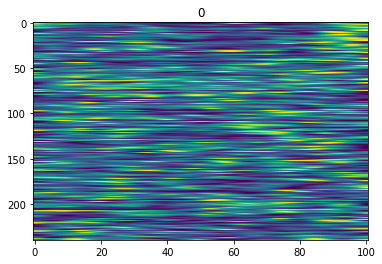

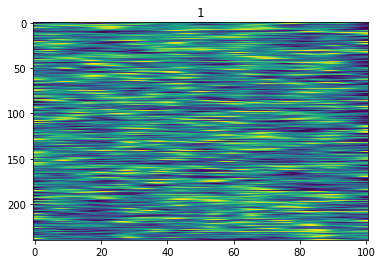

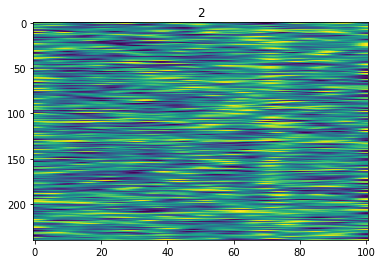

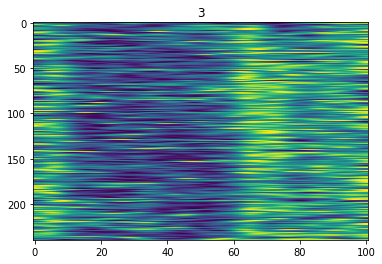

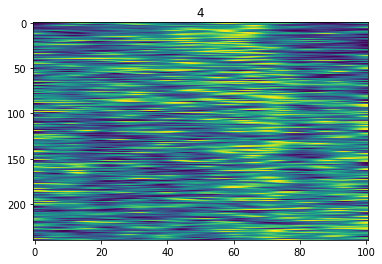

...

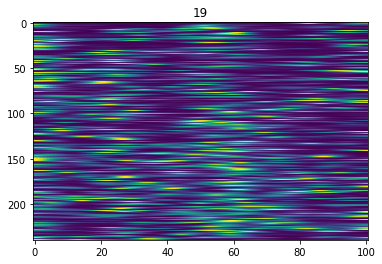

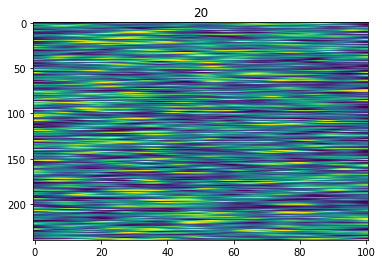

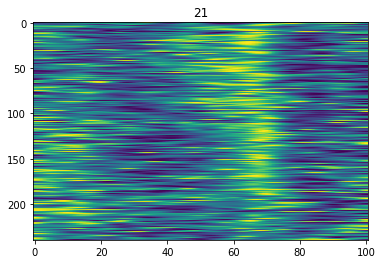

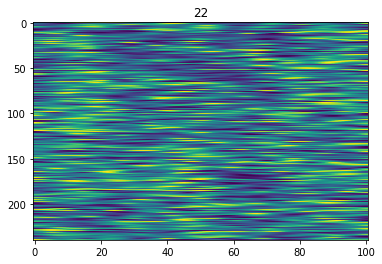

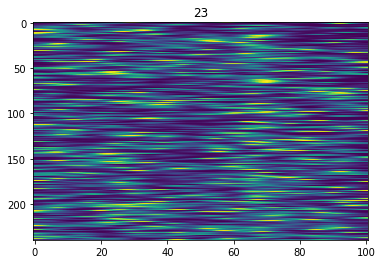

In [64]:
for i in range(Map1.shape[1]):
    plt.figure()
    plt.title(i)
    plt.imshow([normalizedata(gaussian_filter(i, sigma = 3)) if sum(i) > 0 else i for i in Map1[:,i,:]], aspect = 'auto')

In [8]:
# arr = ons
# stim = [23.045733333333335] ## in seconds
# while len(stim) < 350:
#     val = stim[-1] + 10
#     stim.append(find_nearest(arr,val))
# # stim2 = [66.46956666666667+(10.1*i) for i in range(50)]

# #dont rn this cell

In [9]:
gunits = get_units(phy_dp, quality='good')

In [10]:
len(gunits)

119

In [11]:
trains = [trn(phy_dp,i) for i in gunits]
counts = [len(i) for i in trains]

In [12]:
%%time
start = 0
end = (np.max([np.max(i) for i in trains])/30000) - 5
ms = 1 #binsize in ms
spike_array = generate_binned_data(trains, ms/1000, start,end) #time here is always 0.001 so that multiple spikes dont get lumped

spike_array_t = spike_array.transpose()

Wall time: 8.5 s


In [13]:
## code for all analysis

binning finished
Smoothing finished
zscore finished
Got eigenvalues and eigenvectors
Got number of significant assemblies
fastICA finished
Computed assembly strength


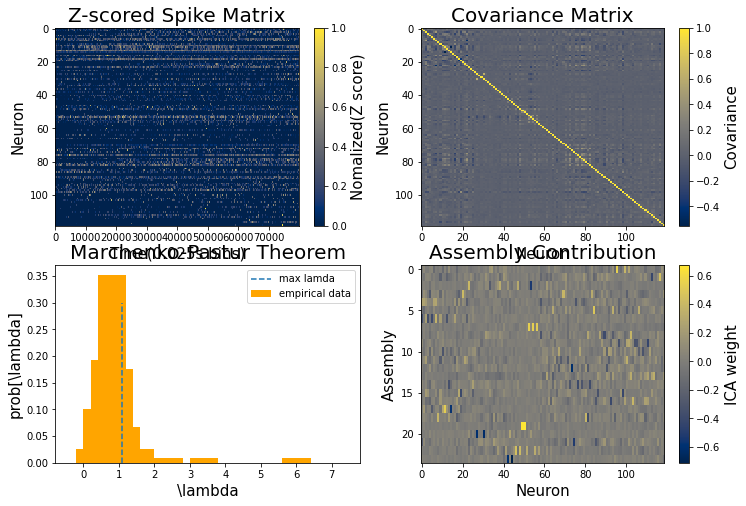

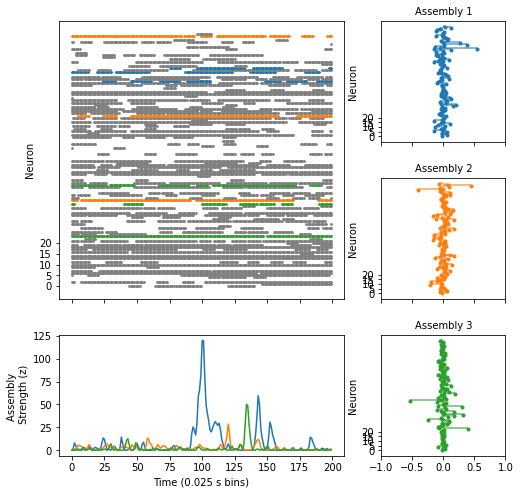

Wall time: 4.41 s


In [14]:
%%time
weight_matrix = EB_assembly_analysis(spike_array_t)[0]

# z_matrix = stats.zscore(stim_spike_array, axis=1)
# assembly_strength = reactivation_strength(weight_matrix, z_matrix)

# assembly_strength = assembly_strength.reshape(assembly_strength.shape[0], 50, 7, 2100)
# for i in range(assembly_strength.shape[0]):
#     for j in range(7):
#         plt.plot(np.mean(assembly_strength[i, :, j, 900:1200].reshape(50, 300), axis=0))
#         plt.xlabel('Time(ms)')
#         plt.ylabel('Assembly strength (average, z-score)')
#         plt.title('Assembly '+str(i)+' stimulation type '+str(j))
#         plt.show()

In [15]:
assembly_activity = reactivation_strength(weight_matrix, spike_array_t) ## assemblies strength in 1 ms bin

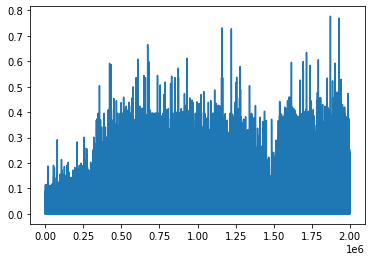

In [27]:
plt.plot(assembly_activity[1])

In [16]:
weight_matrix.shape, assembly_activity.shape, spike_array_t.shape

((119, 24), (24, 1999123), (119, 1999123))

In [22]:
## check if assembly strength is reasonable

In [91]:
%%time
spike_array_z = zscore(spike_array_t, axis=1)
assembly_strength_all = reactivation_strength(weight_matrix, spike_array_z)

Wall time: 1min 9s


In [24]:
assembly_strength_all.shape

(36, 3846995)

In [92]:
afore_indexs = []
for k in range(len(stim)):
    if k == 0:
        afore_indexs = np.arange(int(stim[k]*1000)-2000, int(stim[k]*1000))
    else:
        afore_indexs = np.concatenate((afore_indexs, np.arange(int(stim[k]*1000)-2000, int(stim[k]*1000))))

In [98]:
afore_a_strength = assembly_strength_all[:, afore_indexs]
afore_a_strength_s = gaussian_filter1d(afore_a_strength, sigma=5).reshape(36,50,7,2000)

In [99]:
afore_cell_activity = gaussian_filter1d(spike_array_t[:, afore_indexs], sigma=5).reshape(162, 50, 7, 2000)

In [95]:
%%time
assembly_strength_all2 = np.zeros((weight_matrix.shape[1], spike_array_z.shape[1])) #this will be time resolved assembly strength (np.array with shape(assemblies, time_bins))
for i in range(weight_matrix.shape[1]): #there is probably a better way to code this but fuck it 
    weighted = (spike_array_z.transpose()*weight_matrix[:,i]).transpose()
    assembly_strength_all2[i] = np.sum(weighted, axis=0)

In [100]:
afore_a_strength2 = assembly_strength_all2[:, afore_indexs]
afore_a_strength2_s = gaussian_filter1d(afore_a_strength2, sigma=5).reshape(36,50,7,2000)

In [101]:
stim_a_strength2 = assembly_strength_all2[:, stim_index]
stim_a_strength2_s = gaussian_filter1d(stim_a_strength2, sigma=5).reshape(36, 50, 7, 2100)

In [34]:
stim_spike_array_s = zscore(gaussian_filter1d(stim_spike_array, sigma=1), axis=1).reshape(162, 50, 7, 2100)

In [35]:
def my_zscore(data, mean, std): # data: 1d array mean, std: float
    return (data-mean)/std

In [39]:
assembly_strength_all.shape

(36, 3846995)

In [54]:
weight_matrix.shape

(162, 36)

In [17]:
belong = np.argmax(weight_matrix, axis=1)

In [18]:
belong.shape

(119,)

In [19]:
belong

array([ 4,  4,  6, 15, 12, 10,  4,  6, 18,  6, 17, 17, 17, 18,  9, 12,  6,
       16, 15, 10,  3, 11, 11,  2,  1, 14, 10,  9, 21, 21, 23,  8,  8,  0,
        0, 21, 21, 22,  2,  9,  1, 22,  2, 20,  6, 22, 22,  2, 22, 19, 19,
       22,  7, 20,  7, 22,  7, 22, 14, 11, 10, 13, 16,  3,  5, 11,  9, 10,
       14,  3,  5, 21,  5,  7, 16, 11, 13, 10, 15,  1, 18,  8, 18,  3,  5,
       14, 13,  8,  9, 10, 13, 10, 10,  5,  9,  0, 12, 15,  4,  0, 11,  9,
        8, 16, 10, 22,  5, 13, 21, 16, 13, 10, 13, 13, 11,  8,  1,  0, 13],
      dtype=int64)

In [20]:
assemblies = [[] for i in range(weight_matrix.shape[1])]
for i in range(weight_matrix.shape[1]):
    assemblies[i] = np.where(belong==i)[0]
    assemblies[i] = assemblies[i][np.argsort(weight_matrix[assemblies[i], i])[::-1]]

In [22]:
assembly_cell = []
for i in range(weight_matrix.shape[1]):
    assembly_cell.append(np.argsort(weight_matrix[:, i])[-3:])

In [24]:
for i in range(weight_matrix.shape[1]):
    print('Assembly '+str(i))
    print(assemblies[i])
    print(assembly_cell[i][::-1])

Assembly 0
[ 95  99  34  33 117]
[ 95  99 101]
Assembly 1
[116  40  79  24]
[116  40  79]
Assembly 2
[23 38 47 42]
[23 38 47]
Assembly 3
[20 69 83 63]
[20 69 83]
Assembly 4
[ 1  6  0 98]
[7 1 6]
Assembly 5
[ 84  93 106  64  70  72]
[ 84  93 106]
Assembly 6
[ 7 16  2  9 44]
[ 7 16  2]
Assembly 7
[54 52 56 73]
[54 52 56]
Assembly 8
[102  81  87  31 115  32]
[102  81  87]
Assembly 9
[101  88  94  39  66  14  27]
[101 100  88]
Assembly 10
[ 67  77  91 111  89  92 104  26   5  60  19]
[67 77 91]
Assembly 11
[100  21  22 114  65  75  59]
[100  21   2]
Assembly 12
[96  4 15]
[80 96  4]
Assembly 13
[113 110  61 112  86  90 107 118  76]
[113 102 110]
Assembly 14
[25 68 58 85]
[25 68 58]
Assembly 15
[18 97  3 78]
[18  2  9]
Assembly 16
[103 109  17  62  74]
[103 109  99]
Assembly 17
[11 10 12]
[11 10  1]
Assembly 18
[80  8 13 82]
[80  8 13]
Assembly 19
[50 49]
[50 49 57]
Assembly 20
[43 53]
[43 53 23]
Assembly 21
[ 35 108  71  29  36  28]
[ 35  89 108]
Assembly 22
[ 46  48  55  51  57  41  37  4

Assembly 0
Cell [ 95  94 118]


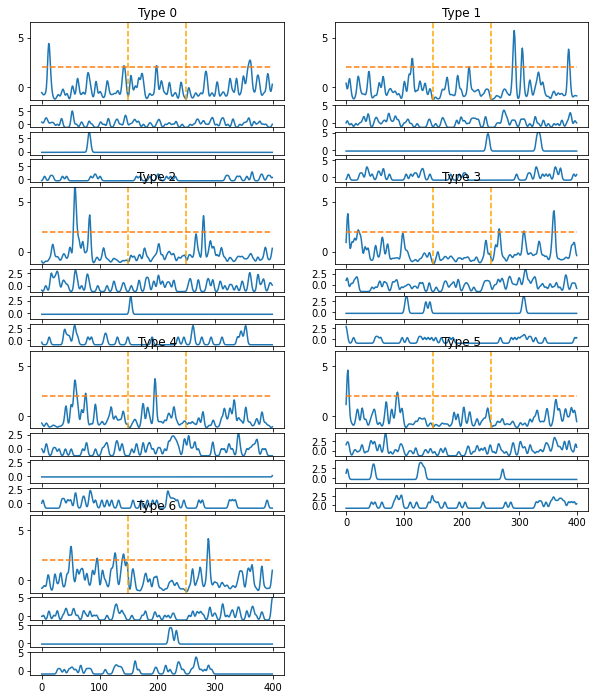

Assembly 1
Cell [115  90 117]


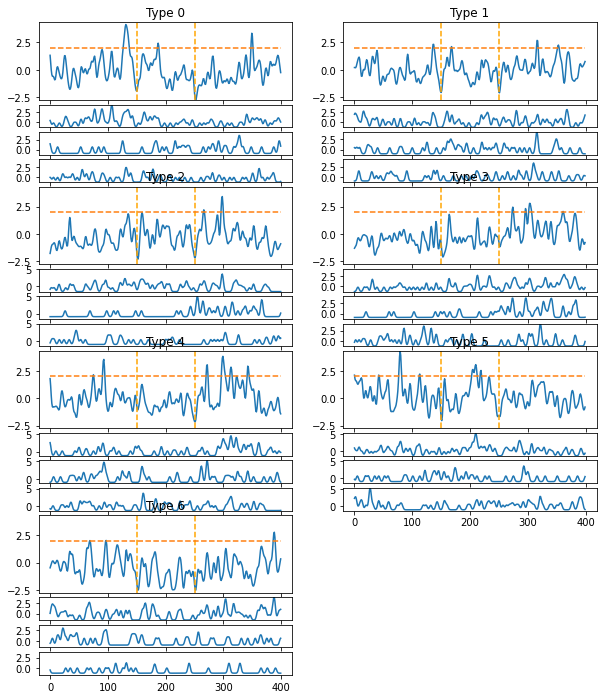

Assembly 2
Cell [19 63 62]


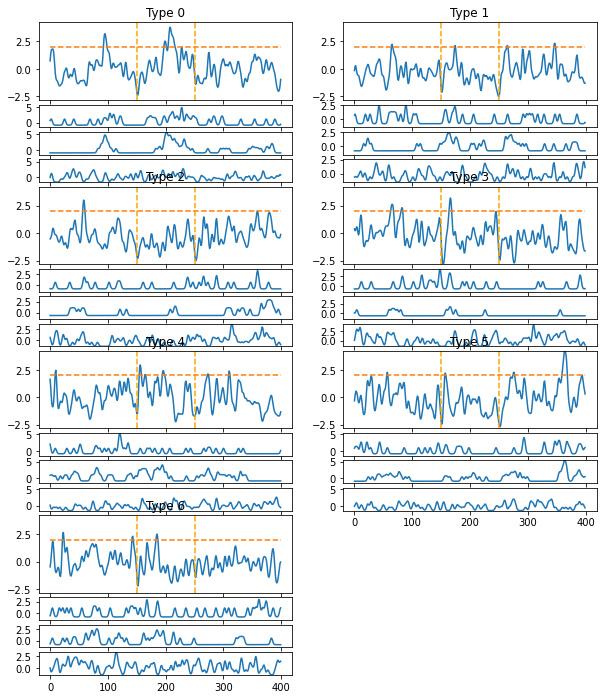

Assembly 3
Cell [159 108 146]


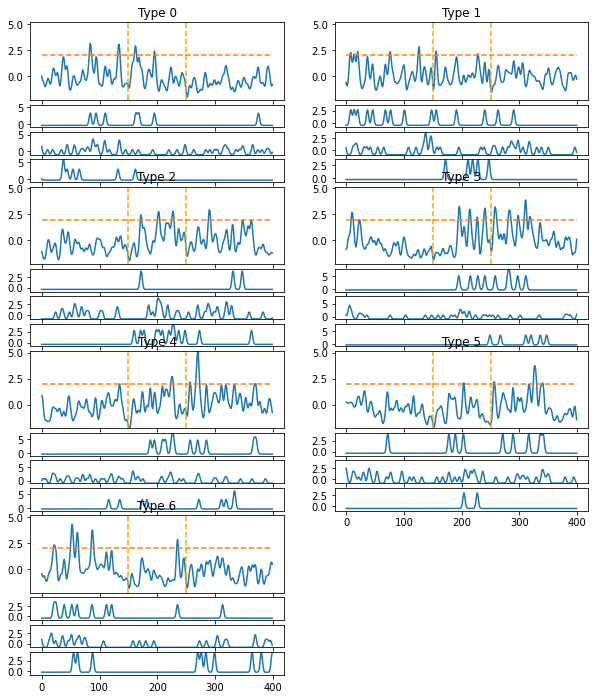

Assembly 4
Cell [4 2 3]


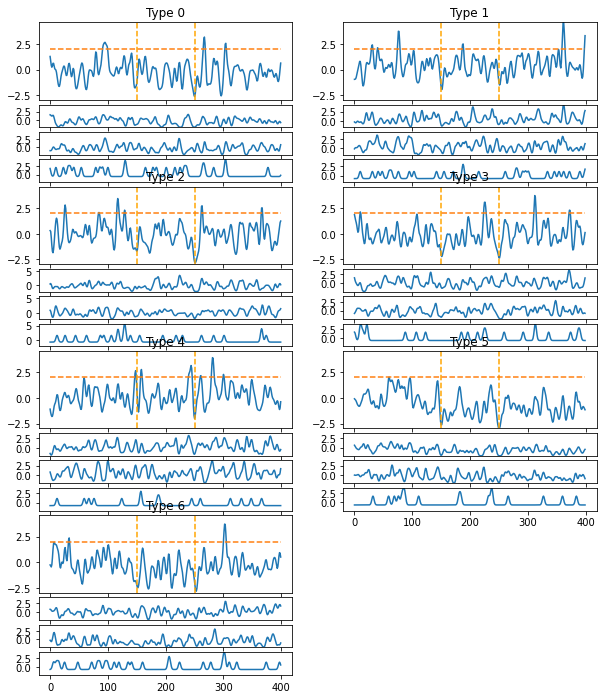

Assembly 5
Cell [125 105 131]


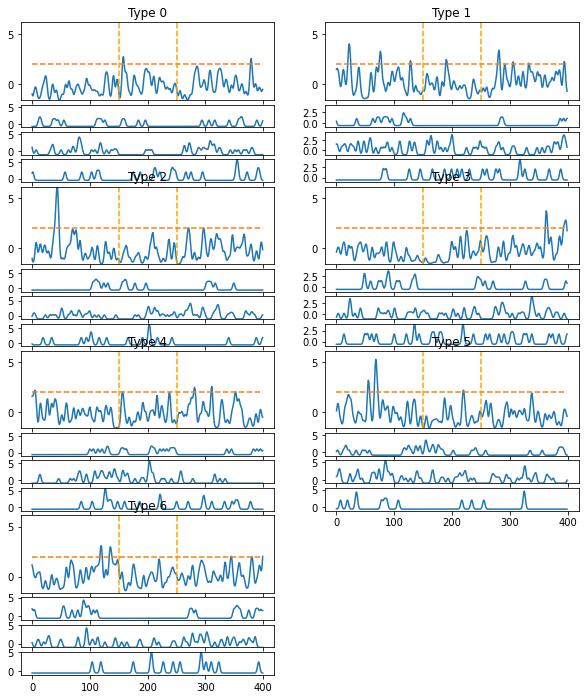

Assembly 6
Cell [148 126 133]


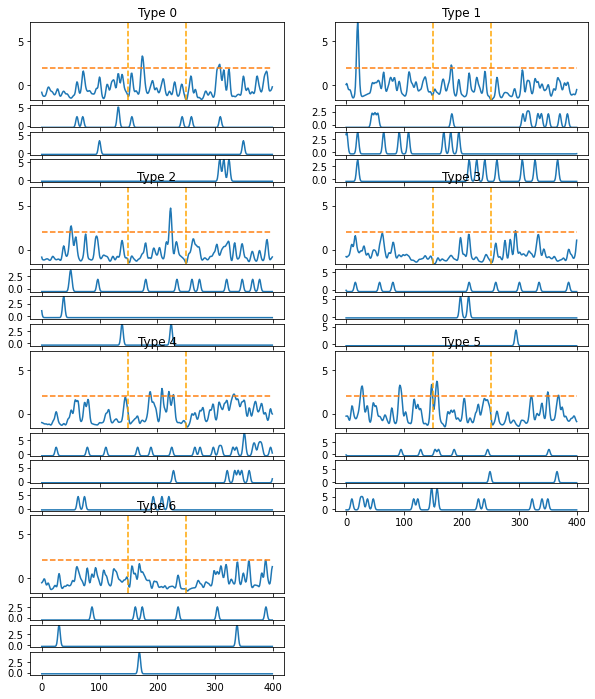

Assembly 7
Cell [19 22  0]


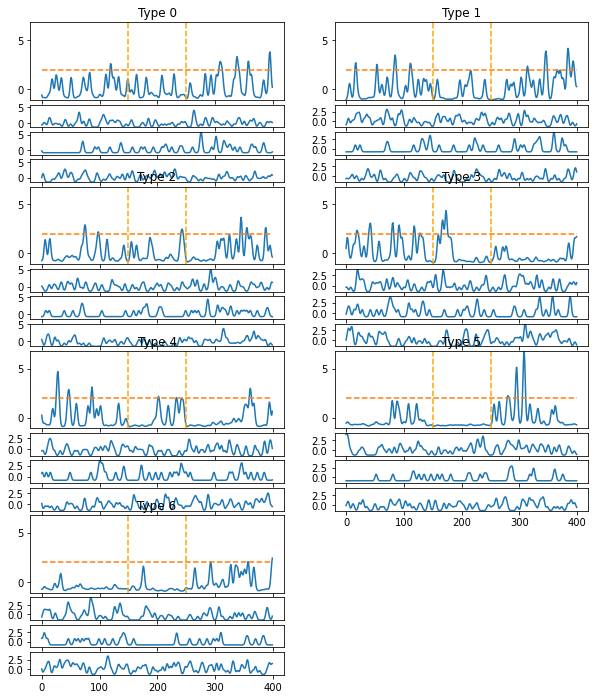

Assembly 8
Cell [102 108 115]


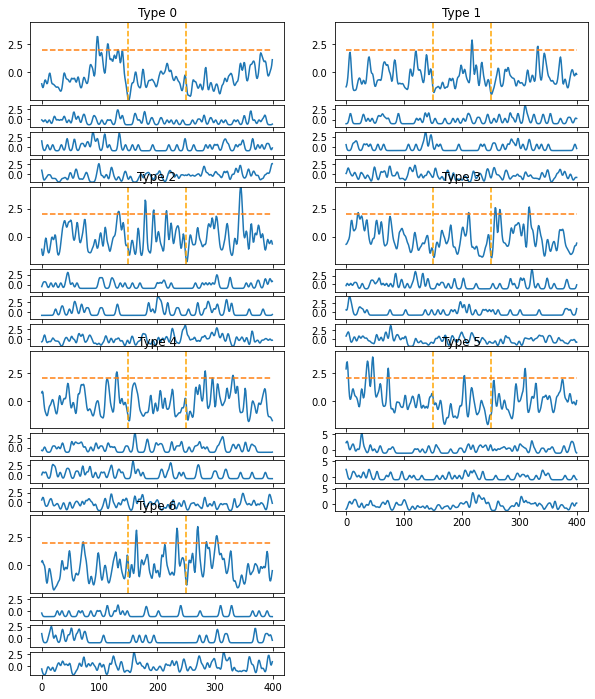

Assembly 9
Cell [108 102  97]


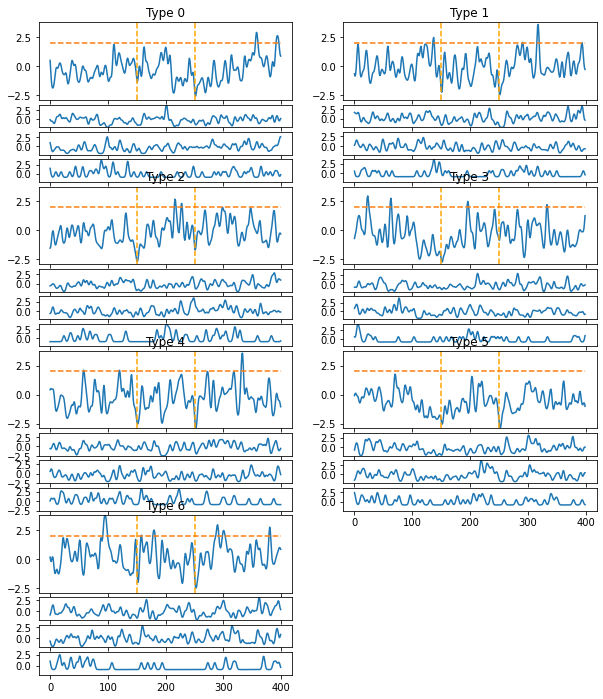

Assembly 10
Cell [63 66 57]


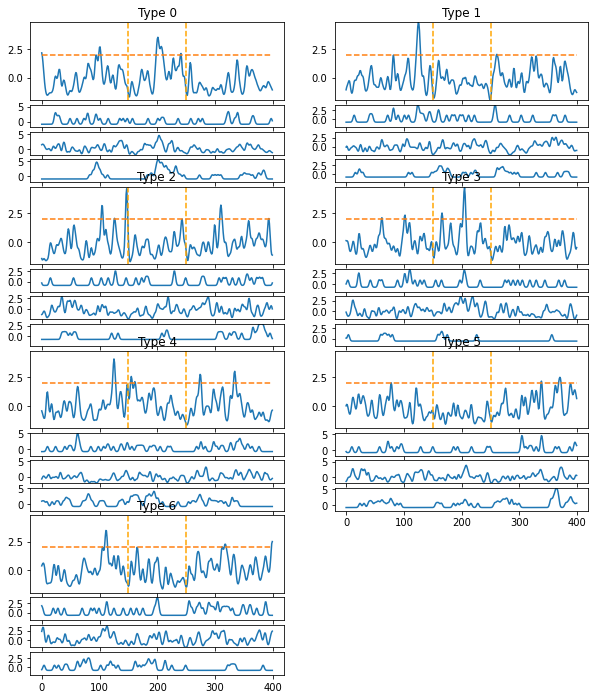

Assembly 11
Cell [  1 143 140]


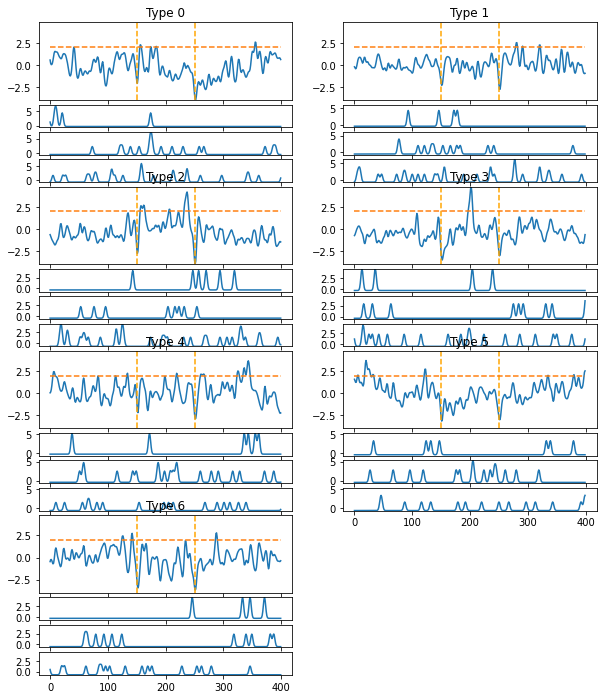

Assembly 12
Cell [68  4  1]


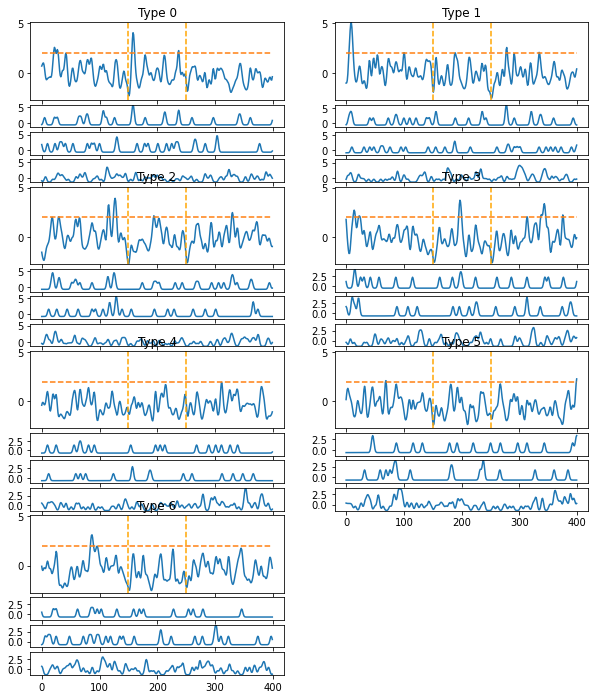

Assembly 13
Cell [131  24  17]


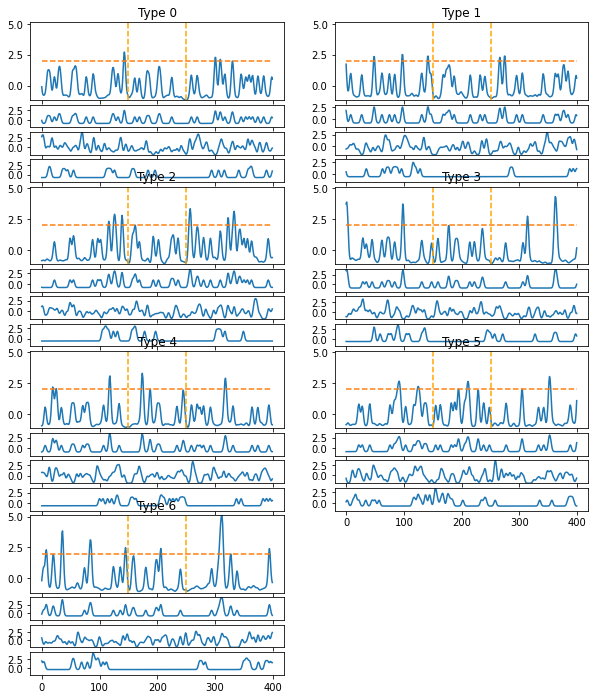

Assembly 14
Cell [19 16 24]


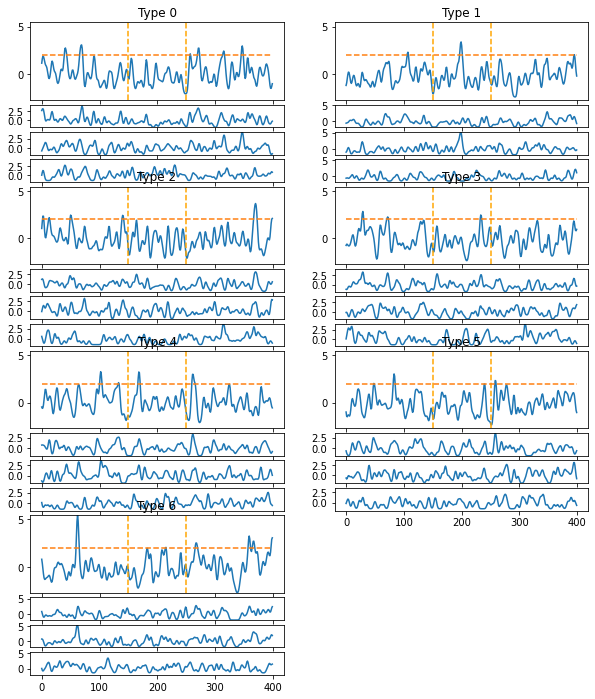

Assembly 15
Cell [111 123 107]


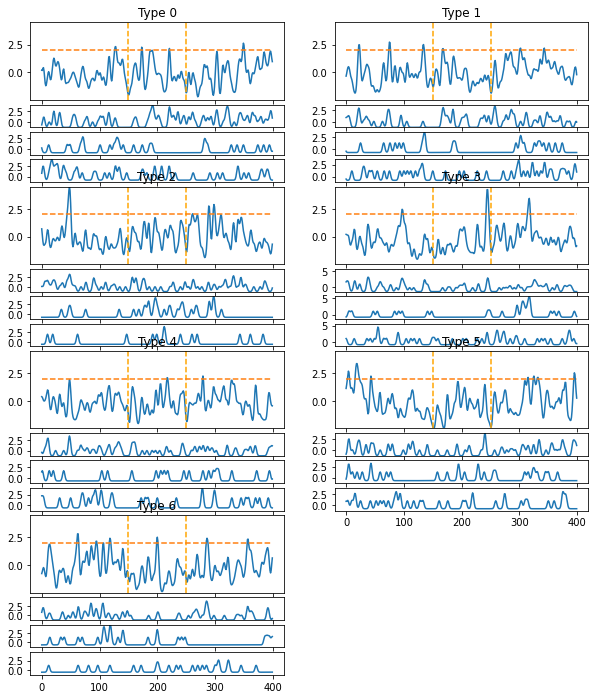

Assembly 16
Cell [74 80 71]


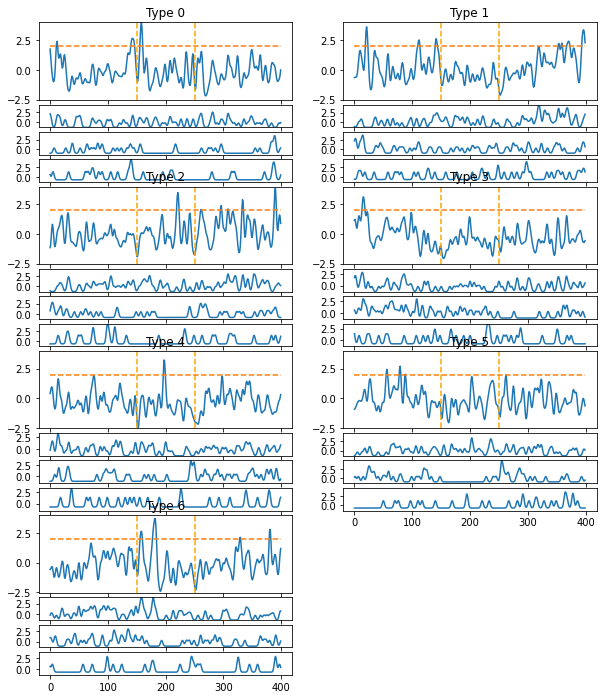

Assembly 17
Cell [143  64  70]


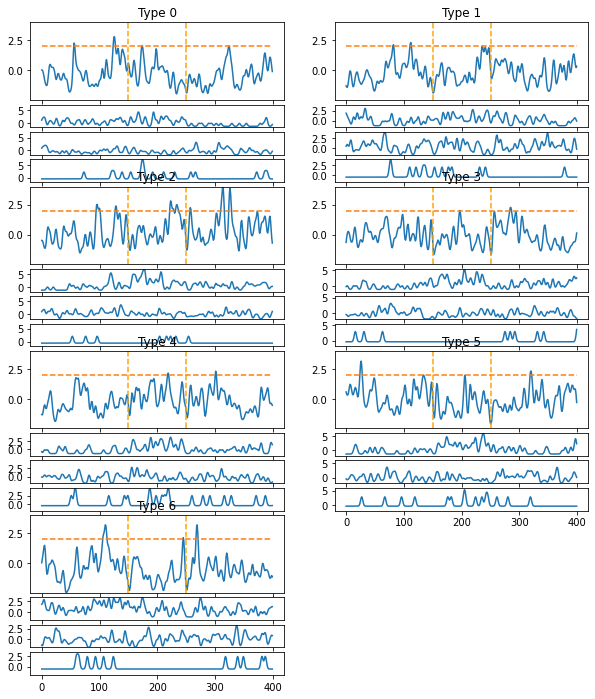

Assembly 18
Cell [135 143  70]


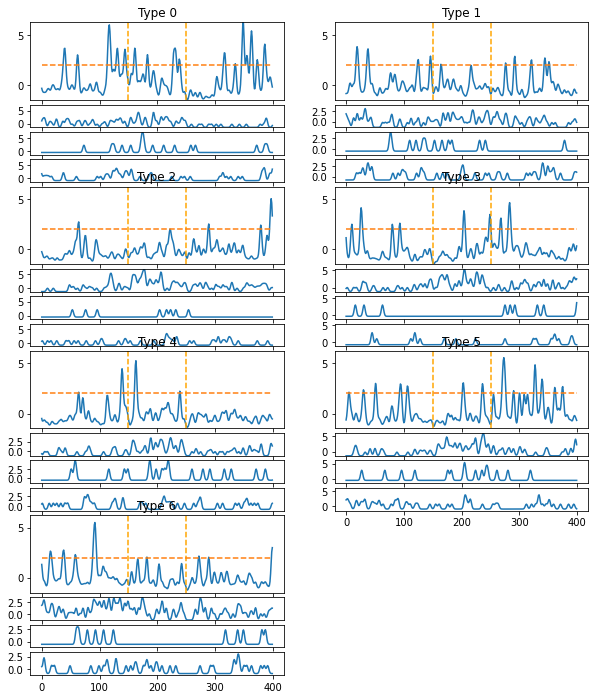

Assembly 19
Cell [ 91 133 125]


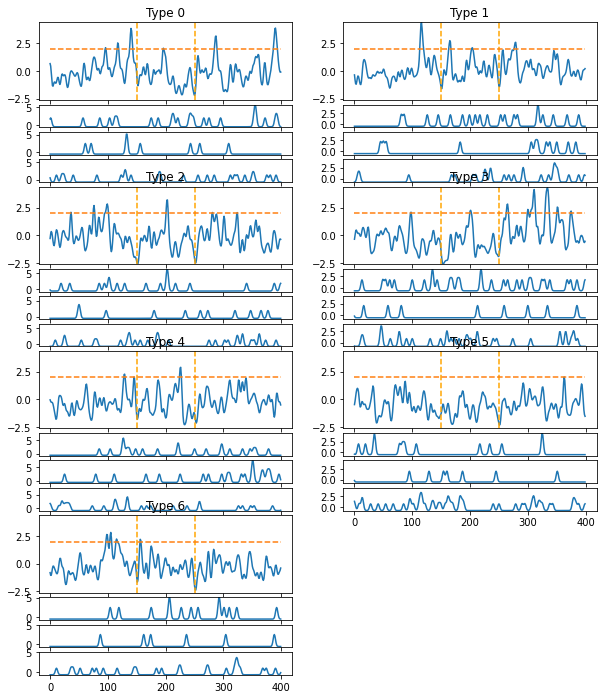

Assembly 20
Cell [75 85 82]


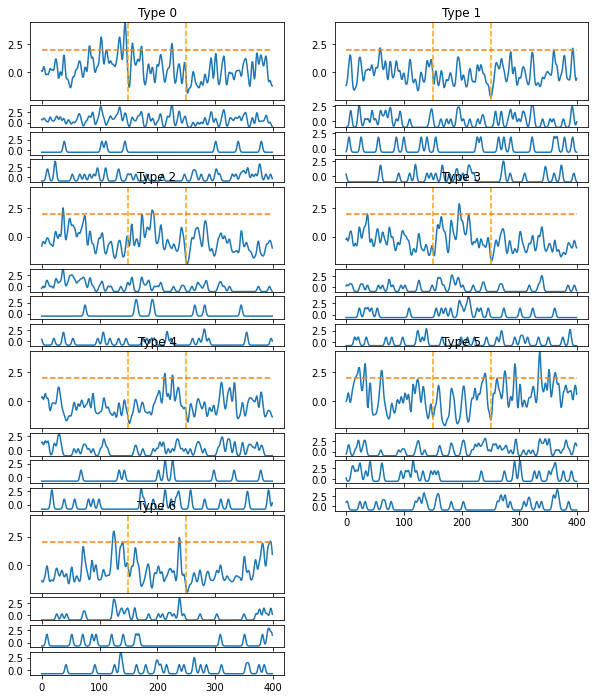

Assembly 21
Cell [101  40  76]


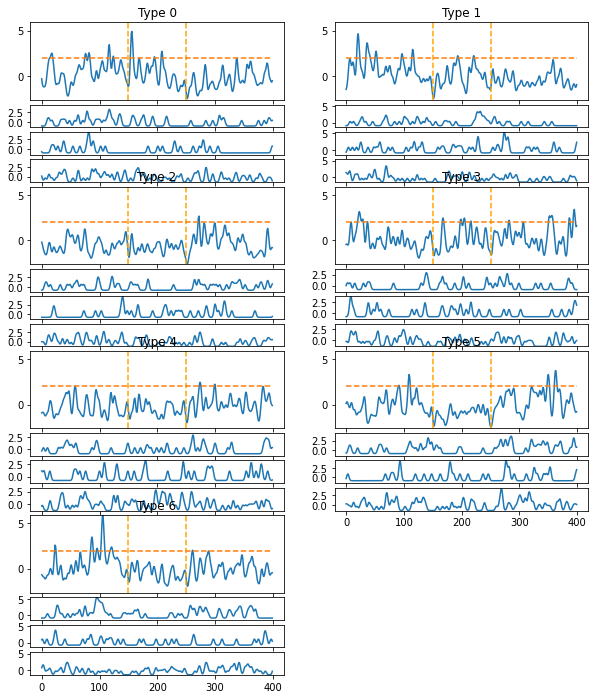

Assembly 22
Cell [66 55 61]


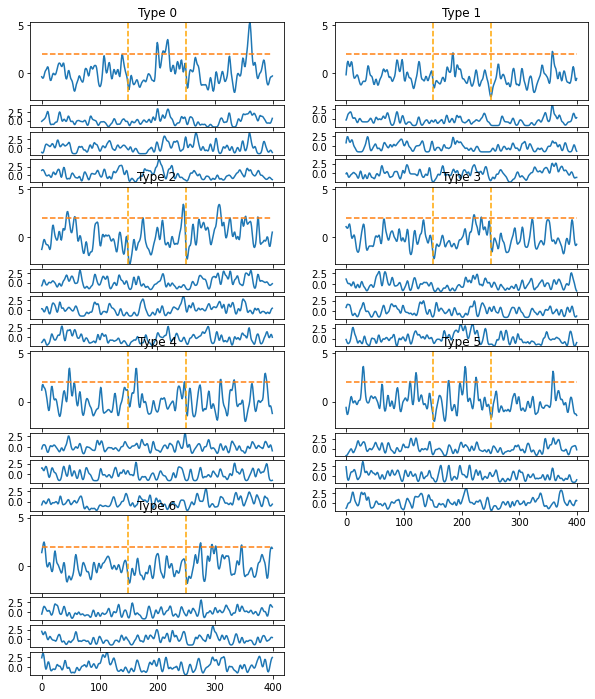

Assembly 23
Cell [95 84 85]


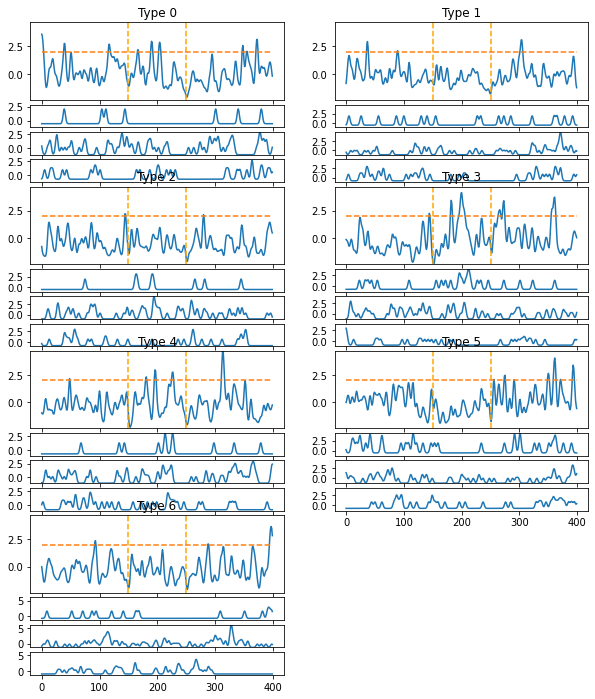

Assembly 24
Cell [15 18 34]


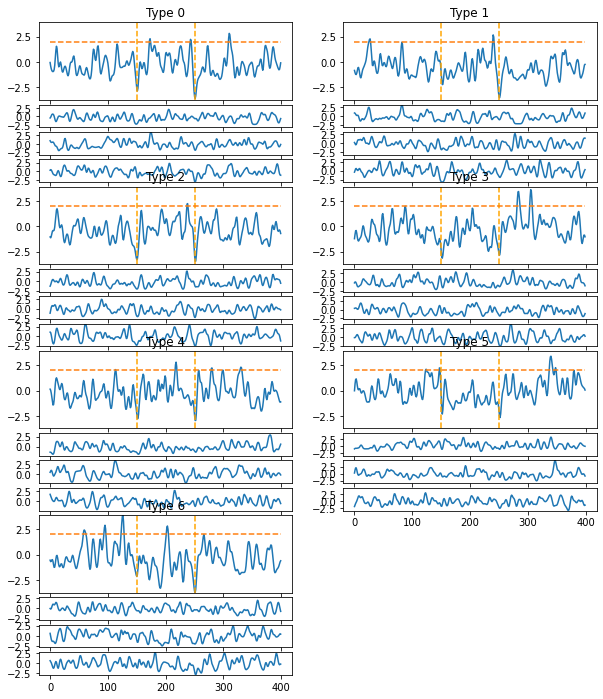

Assembly 25
Cell [67 30 31]


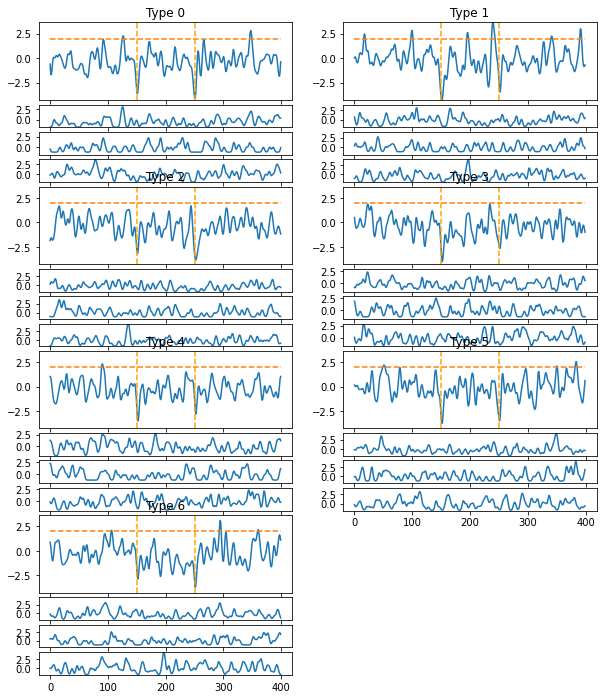

Assembly 26
Cell [46 48 39]


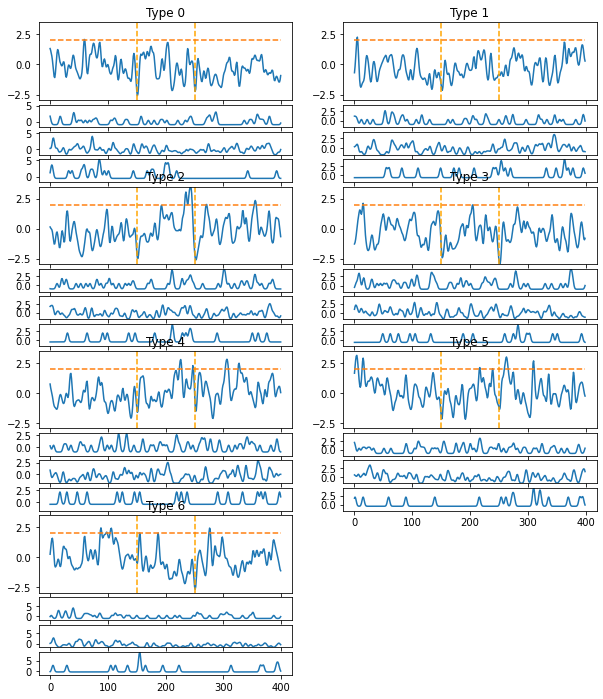

Assembly 27
Cell [ 5 75 34]


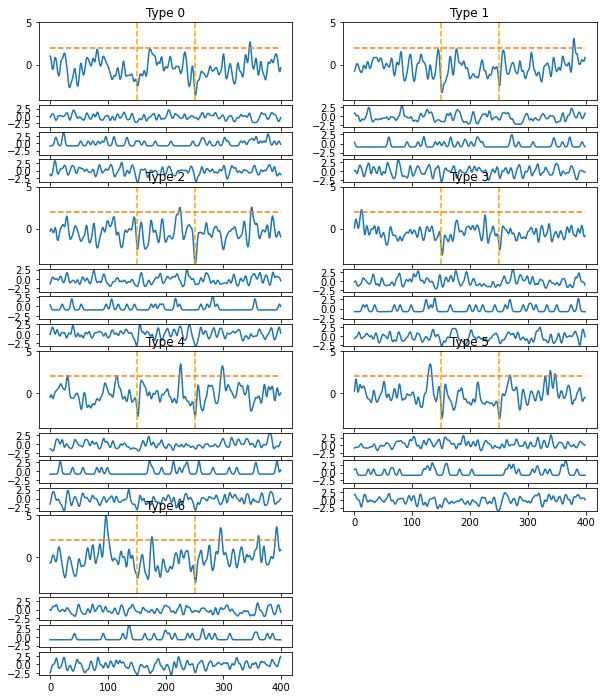

Assembly 28
Cell [145  46  29]


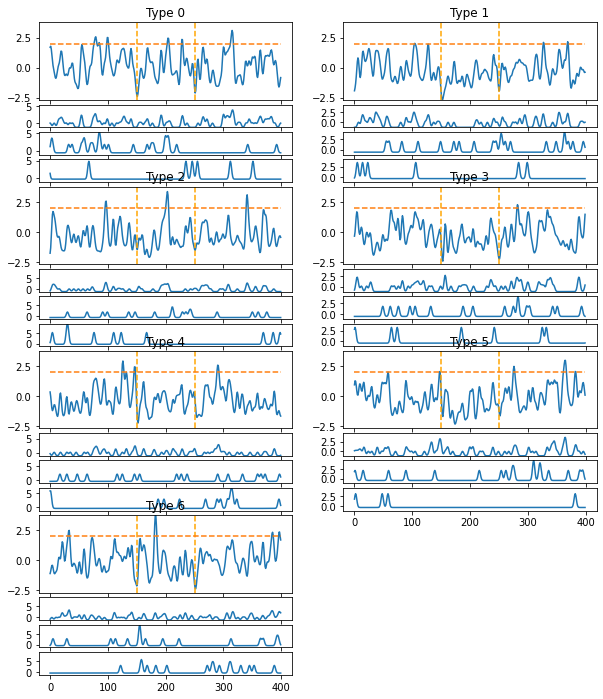

Assembly 29
Cell [ 88   1 114]


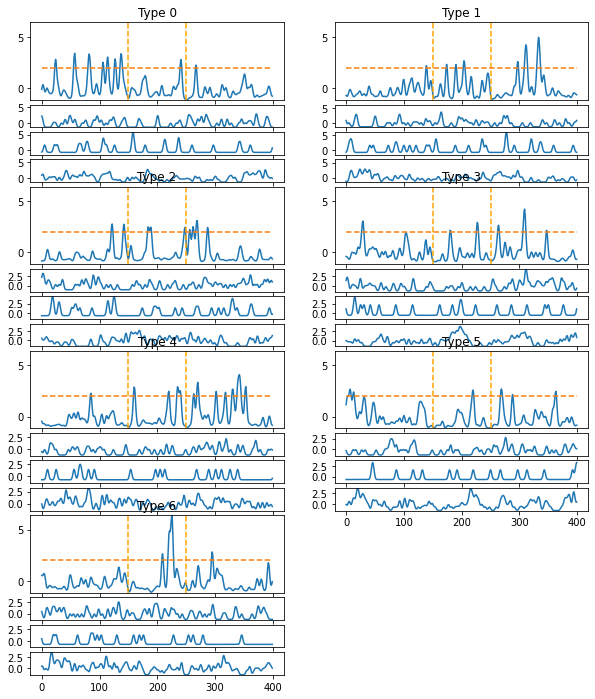

Assembly 30
Cell [145  84 111]


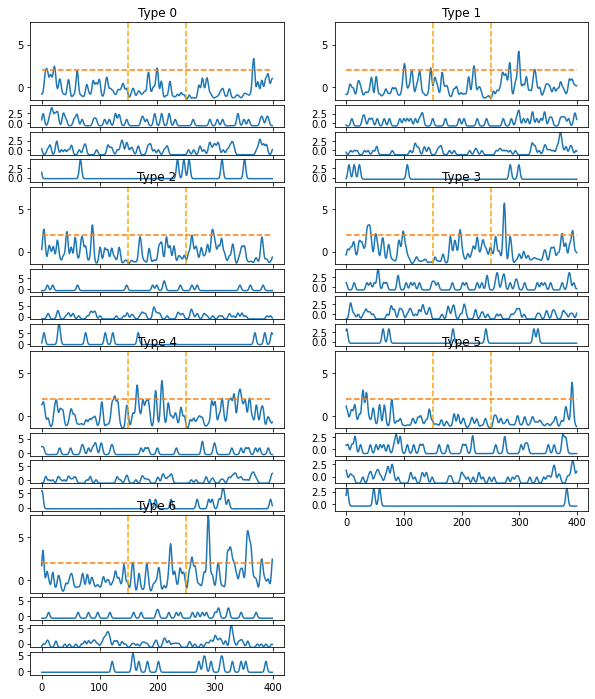

Assembly 31
Cell [108  27  22]


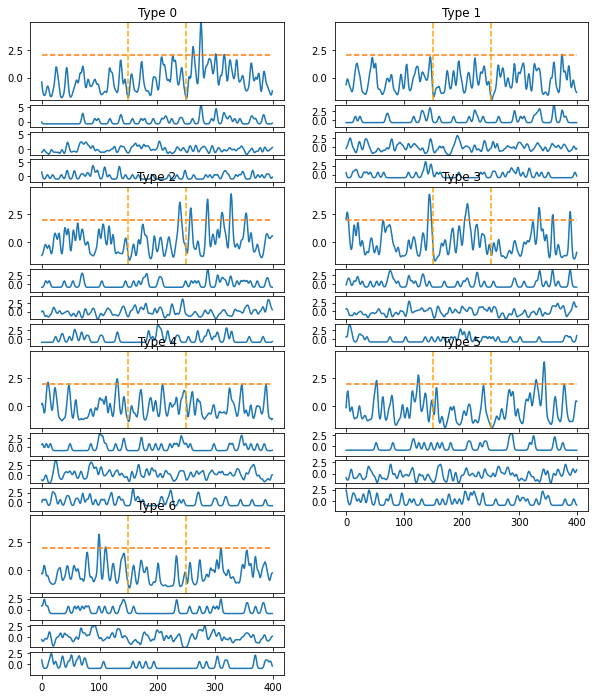

Assembly 32
Cell [132 128 137]


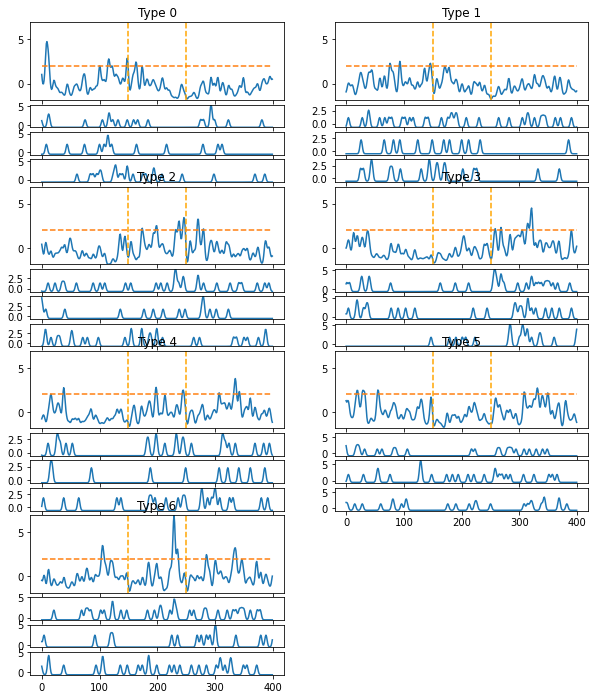

Assembly 33
Cell [ 6  8 10]


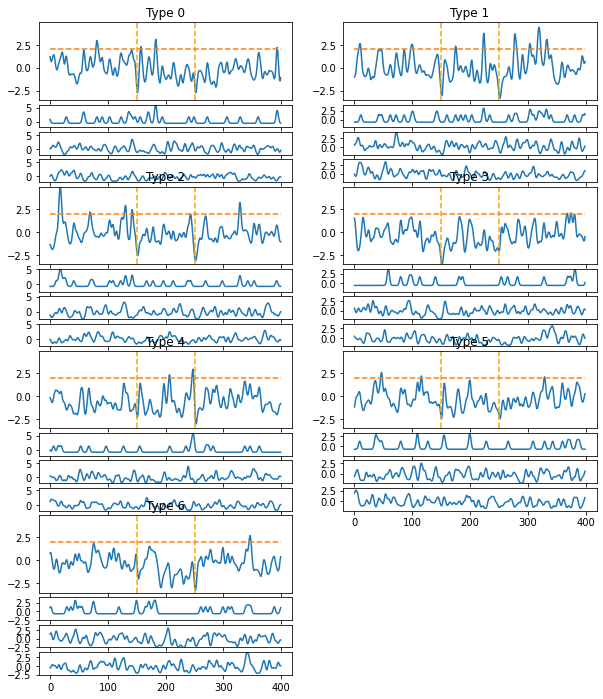

Assembly 34
Cell [146 138  40]


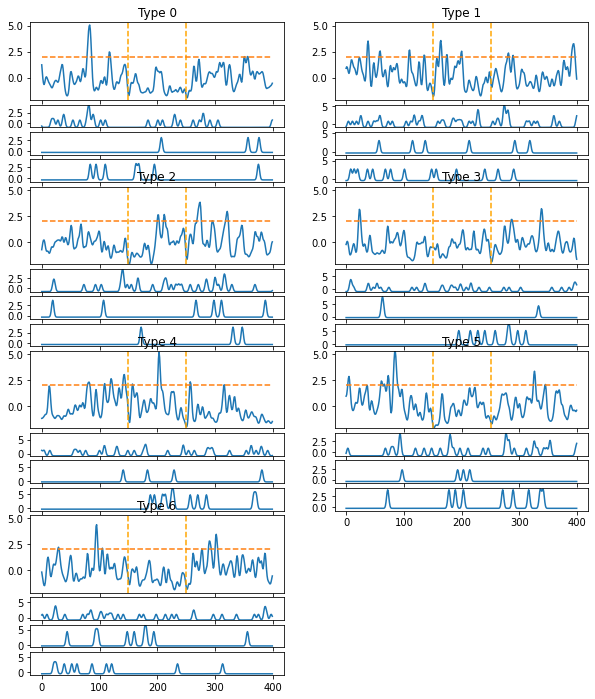

Assembly 35
Cell [39 38 36]


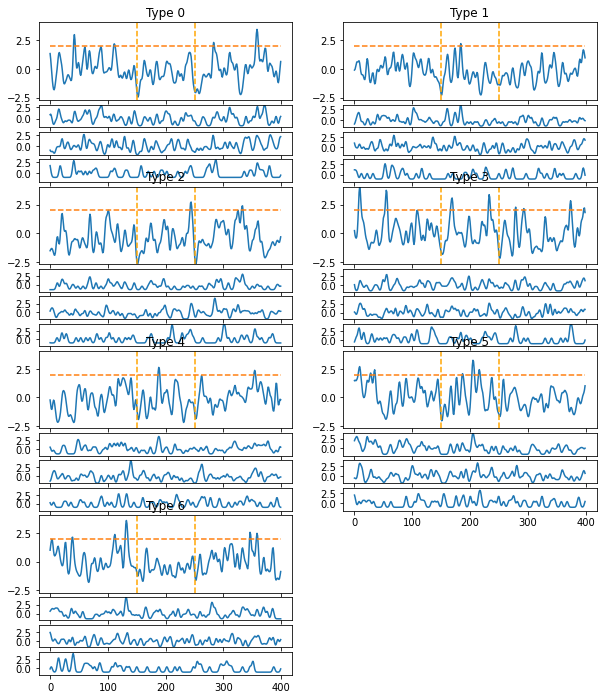

In [87]:
afore_cell_activity_s = gaussian_filter1d(spike_array_t[:, afore_indexs], sigma=2).reshape(162, 50, 7, 2000)
stim_spike_array_s = gaussian_filter1d(stim_spike_array, sigma=2).reshape(162, 50, 7, 2100)
stim_a_strength_s = gaussian_filter1d(assembly_strength_all[:, stim_index], sigma=2).reshape(36, 50, 7, 2100)
afore_a_strength_s = gaussian_filter1d(afore_a_strength, sigma=2)
for i in range(stim_a_strength_s.shape[0]):
    pop = [[] for j in range(7)]
    maxs = [[] for j in range(7)]
    mins = [[] for j in range(7)]
    cells = [[] for j in range(7)]
    indexs = np.argsort(weight_matrix[:, i])[-3:]
    for j in range(7):
        mean = np.mean(afore_a_strength_s[i, :, j, :])
        std = np.std(np.mean(afore_a_strength_s[i, :, j, :], axis=0))
        pop[j] = my_zscore(np.mean(stim_a_strength_s[i, :, j, 850:1250], axis=0), mean, std)
        maxs[j] = np.max(pop[j][150:250])
        mins[j] = np.min(pop[j][150:250])
        for k in range(3):
            mean = np.mean(afore_cell_activity_s[indexs[-k-1], :, j, :])
            std = np.std(np.mean(afore_cell_activity_s[indexs[-k-1], :, j, :], axis=0))
            cells[j].append(my_zscore(np.mean(stim_spike_array_s[indexs[-k-1], :, j, 850:1250], axis=0), mean, std))
    if max(maxs) <= 2 and min(mins) >= -2:
        continue
    
    max1 = np.max(pop[0])
    min1 = np.min(pop[0])
    max2 = np.max(pop[1])
    min2 = np.min(pop[1])
    max3 = np.max(pop[2])
    min3 = np.min(pop[2])
    max4 = np.max(pop[3])
    min4 = np.min(pop[3])
    max5 = np.max(pop[4])
    min5 = np.min(pop[4])
    max6 = np.max(pop[5])
    min6 = np.min(pop[5])
    max7 = np.max(pop[6])
    min7 = np.min(pop[6])
    
    fig = plt.figure(figsize=(10, 12))
    gs = fig.add_gridspec(4*6, 2)
    ax1 = fig.add_subplot(gs[:3, 0], )
    ax1.plot(pop[0])
#     ax1.plot(np.ones(400)*5)
    indexs = np.argsort(weight_matrix[:, i])[-3:]
#     assembly_cell.append(indexs)
    ax11 = fig.add_subplot(gs[3, 0], )
    ax11.plot(cells[0][0])
#     ax11.set_title('Cell '+str(indexs[0]))
    ax12 = fig.add_subplot(gs[4, 0], )
    ax12.plot(cells[0][1])
#     ax12.set_title('Cell '+str(indexs[1]))
    ax13 = fig.add_subplot(gs[5, 0], )
    ax13.plot(cells[0][2])
#     ax13.set_title('Cell '+str(indexs[2]))
    min11 = np.min(cells[0][0])
    max11 = np.max(cells[0][0])
    min12 = np.min(cells[0][1])
    max12 = np.max(cells[0][1])
    min13 = np.min(cells[0][2])
    max13 = np.max(cells[0][2])
    plt.setp([ax11, ax12, ax13], ylim=[min(min11, min12, min13)-0.01, max(max11, max12, max13)+0.01])
    ax1.set_title('Type 0')
    
    ax2 = fig.add_subplot(gs[:3, 1], )
    ax2.plot(pop[1])
#     ax2.plot(np.ones(400)*5)
    ax21 = fig.add_subplot(gs[3, 1], )
    ax21.plot(cells[1][0])
#     ax21.set_title('Cell '+str(indexs[0]))
    ax22 = fig.add_subplot(gs[4, 1], )
    ax22.plot(cells[1][1])
#     ax22.set_title('Cell '+str(indexs[1]))
    ax23 = fig.add_subplot(gs[5, 1], )
    ax23.plot(cells[1][2])
#     ax23.set_title('Cell '+str(indexs[2]))
    min21 = np.min(cells[1][0])
    max21 = np.max(cells[1][0])
    min22 = np.min(cells[1][1])
    max22 = np.max(cells[1][1])
    min23 = np.min(cells[1][2])
    max23 = np.max(cells[1][2])
    plt.setp([ax21, ax22, ax23], ylim=[min(min21, min22, min23)-0.01, max(max21, max22, max23)+0.01])
    ax2.set_title('Type 1')
    
    ax3 = fig.add_subplot(gs[6:9, 0], )
    ax3.plot(pop[2])
#     ax3.plot(np.ones(400)*5)
    ax31 = fig.add_subplot(gs[9, 0], )
    ax31.plot(cells[2][0])
#     ax31.set_title('Cell '+str(indexs[0]))
    ax32 = fig.add_subplot(gs[10, 0], )
    ax32.plot(cells[2][1])
#     ax32.set_title('Cell '+str(indexs[1]))
    ax33 = fig.add_subplot(gs[11, 0], )
    ax33.plot(cells[2][2])
#     ax33.set_title('Cell '+str(indexs[2]))
    min31 = np.min(cells[2][0])
    max31 = np.max(cells[2][0])
    min32 = np.min(cells[2][1])
    max32 = np.max(cells[2][1])
    min33 = np.min(cells[2][2])
    max33 = np.max(cells[2][2])
    plt.setp([ax31, ax32, ax33], ylim=[min(min31, min32, min33)-0.01, max(max31, max32, max33)+0.01])
    ax3.set_title('Type 2')
    
    ax4 = fig.add_subplot(gs[6:9, 1], )
    ax4.plot(pop[3])
#     ax4.plot(np.ones(400)*5)
    ax41 = fig.add_subplot(gs[9, 1], )
    ax41.plot(cells[3][0])
#     ax41.set_title('Cell '+str(indexs[0]))
    ax42 = fig.add_subplot(gs[10, 1], )
    ax42.plot(cells[3][1])
#     ax42.set_title('Cell '+str(indexs[1]))
    ax43 = fig.add_subplot(gs[11, 1], )
    ax43.plot(cells[3][2])
#     ax43.set_title('Cell '+str(indexs[2]))
    min41 = np.min(cells[3][0])
    max41 = np.max(cells[3][0])
    min42 = np.min(cells[3][1])
    max42 = np.max(cells[3][1])
    min43 = np.min(cells[3][2])
    max43 = np.max(cells[3][2])
    plt.setp([ax41, ax42, ax43], ylim=[min(min41, min42, min43)-0.01, max(max41, max42, max43)+0.01])
    ax4.set_title('Type 3')
    
    ax5 = fig.add_subplot(gs[12:15, 0], )
    ax5.plot(pop[4])
#     ax5.plot(np.ones(400)*5)
    ax51 = fig.add_subplot(gs[15, 0], )
    ax51.plot(cells[4][0])
#     ax51.set_title('Cell '+str(indexs[0]))
    ax52 = fig.add_subplot(gs[16, 0], )
    ax52.plot(cells[4][1])
#     ax52.set_title('Cell '+str(indexs[1]))
    ax53 = fig.add_subplot(gs[17, 0], )
    ax53.plot(cells[4][2])
#     ax53.set_title('Cell '+str(indexs[2]))
    min51 = np.min(cells[4][0])
    max51 = np.max(cells[4][0])
    min52 = np.min(cells[4][1])
    max52 = np.max(cells[4][1])
    min53 = np.min(cells[4][2])
    max53 = np.max(cells[4][2])
    plt.setp([ax51, ax52, ax53], ylim=[min(min51, min52, min53)-0.01, max(max51, max52, max53)+0.01])
    ax5.set_title('Type 4')
    
    ax6 = fig.add_subplot(gs[12:15, 1], )
    ax6.plot(pop[5])
#     ax6.plot(np.ones(400)*5)
    ax61 = fig.add_subplot(gs[15, 1],)
    ax61.plot(cells[5][0])
#     ax61.set_title('Cell '+str(indexs[0]))
    ax62 = fig.add_subplot(gs[16, 1],)
    ax62.plot(cells[5][1])
#     ax62.set_title('Cell '+str(indexs[1]))
    ax63 = fig.add_subplot(gs[17, 1],)
    ax63.plot(cells[5][2])
#     ax63.set_title('Cell '+str(indexs[2]))
    min61 = np.min(cells[5][0])
    max61 = np.max(cells[5][0])
    min62 = np.min(cells[5][1])
    max62 = np.max(cells[5][1])
    min63 = np.min(cells[5][2])
    max63 = np.max(cells[5][2])
    plt.setp([ax61, ax62, ax63], ylim=[min(min61, min62, min63)-0.01, max(max61, max62, max63)+0.01])
    ax6.set_title('Type 5')
    
    ax7 = fig.add_subplot(gs[18:21, 0], )
    ax7.plot(pop[6])
#     ax7.plot(np.ones(400)*5)
    ax71 = fig.add_subplot(gs[21, 0], )
    ax71.plot(cells[6][0])
#     ax71.set_title('Cell '+str(indexs[0]))
    ax72 = fig.add_subplot(gs[22, 0], )
    ax72.plot(cells[6][1])
#     ax72.set_title('Cell '+str(indexs[1]))
    ax73 = fig.add_subplot(gs[23, 0], )
    ax73.plot(cells[6][2])
#     ax73.set_title('Cell '+str(indexs[2]))
    min71 = np.min(cells[6][0])
    max71 = np.max(cells[6][0])
    min72 = np.min(cells[6][1])
    max72 = np.max(cells[6][1])
    min73 = np.min(cells[6][2])
    max73 = np.max(cells[6][2])
    plt.setp([ax71, ax72, ax73], ylim=[min(min71, min72, min73)-0.01, max(max71, max72, max73)+0.01])
    ax7.set_title('Type 6')
    
    plt.setp([ax1, ax2, ax3, ax4, ax5, ax6, ax7], ylim=[min(min1, min2, min3, min4, min5, min6, min7),
                                                       max(max1, max2, max3, max4, max5, max6, max7)])
    
    minn = min(min1, min2, min3, min4, min5, min6, min7)
    maxx = max(max1, max2, max3, max4, max5, max6, max7)
    
    ax1.plot(np.ones(100)*150, np.linspace(minn, maxx, 100), color='orange', linestyle='--')
    ax1.plot(np.ones(100)*250, np.linspace(minn, maxx, 100), color='orange', linestyle='--')
    ax1.plot(np.ones(400)*2, linestyle='--')
    ax2.plot(np.ones(100)*150, np.linspace(minn, maxx, 100), color='orange', linestyle='--')
    ax2.plot(np.ones(100)*250, np.linspace(minn, maxx, 100), color='orange', linestyle='--')
    ax2.plot(np.ones(400)*2, linestyle='--')
    ax3.plot(np.ones(100)*150, np.linspace(minn, maxx, 100), color='orange', linestyle='--')
    ax3.plot(np.ones(100)*250, np.linspace(minn, maxx, 100), color='orange', linestyle='--')
    ax3.plot(np.ones(400)*2, linestyle='--')
    ax4.plot(np.ones(100)*150, np.linspace(minn, maxx, 100), color='orange', linestyle='--')
    ax4.plot(np.ones(100)*250, np.linspace(minn, maxx, 100), color='orange', linestyle='--')
    ax4.plot(np.ones(400)*2, linestyle='--')
    ax5.plot(np.ones(100)*150, np.linspace(minn, maxx, 100), color='orange', linestyle='--')
    ax5.plot(np.ones(100)*250, np.linspace(minn, maxx, 100), color='orange', linestyle='--')
    ax5.plot(np.ones(400)*2, linestyle='--')
    ax6.plot(np.ones(100)*150, np.linspace(minn, maxx, 100), color='orange', linestyle='--')
    ax6.plot(np.ones(100)*250, np.linspace(minn, maxx, 100), color='orange', linestyle='--')
    ax6.plot(np.ones(400)*2, linestyle='--')
    ax7.plot(np.ones(100)*150, np.linspace(minn, maxx, 100), color='orange', linestyle='--')
    ax7.plot(np.ones(100)*250, np.linspace(minn, maxx, 100), color='orange', linestyle='--')
    ax7.plot(np.ones(400)*2, linestyle='--')
    
    plt.setp(ax1.get_xticklabels(), visible=False)
    plt.setp(ax11.get_xticklabels(), visible=False)
    plt.setp(ax12.get_xticklabels(), visible=False)
#     plt.setp(ax13.get_xticklabels(), visible=False)
    plt.setp(ax2.get_xticklabels(), visible=False)
    plt.setp(ax21.get_xticklabels(), visible=False)
    plt.setp(ax22.get_xticklabels(), visible=False)
#     plt.setp(ax23.get_xticklabels(), visible=False)
    plt.setp(ax3.get_xticklabels(), visible=False)
    plt.setp(ax31.get_xticklabels(), visible=False)
    plt.setp(ax32.get_xticklabels(), visible=False)
#     plt.setp(ax33.get_xticklabels(), visible=False)
    plt.setp(ax4.get_xticklabels(), visible=False)
    plt.setp(ax41.get_xticklabels(), visible=False)
    plt.setp(ax42.get_xticklabels(), visible=False)
#     plt.setp(ax43.get_xticklabels(), visible=False)
    plt.setp(ax5.get_xticklabels(), visible=False)
    plt.setp(ax51.get_xticklabels(), visible=False)
    plt.setp(ax52.get_xticklabels(), visible=False)
#     plt.setp(ax53.get_xticklabels(), visible=False)
    plt.setp(ax6.get_xticklabels(), visible=False)
    plt.setp(ax61.get_xticklabels(), visible=False)
    plt.setp(ax62.get_xticklabels(), visible=False)
#     plt.setp(ax63.get_xticklabels(), visible=False)
    plt.setp(ax7.get_xticklabels(), visible=False)
    plt.setp(ax71.get_xticklabels(), visible=False)
    plt.setp(ax72.get_xticklabels(), visible=False)
#     plt.setp(ax73.get_xticklabels(), visible=False)
#     plt.setp[[ax1, ax11, ax12, ax13, 
#               ax2, ax21, ax22, ax23,
#               ax3, ax31, ax32, ax33,
#               ax4, ax41, ax42, ax43,
#               ax5, ax51, ax52, ax53,
#               ax6, ax61, ax62, ax63,
#               ax7, ax71, ax72, ax73], title='Assembly '+str(i)]
    print('Assembly '+str(i))
    print('Cell', indexs)
#     plt.tight_layout()
    plt.show()

Assembly 0
Cell [ 95  94 118]


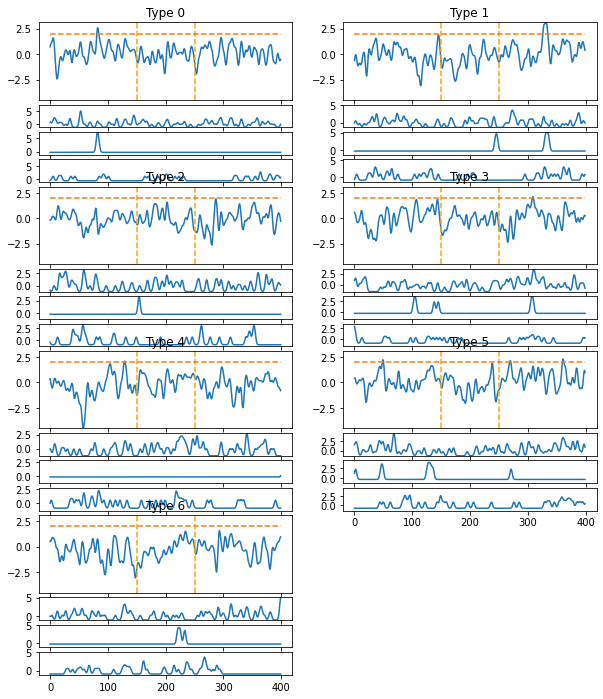

Assembly 1
Cell [115  90 117]


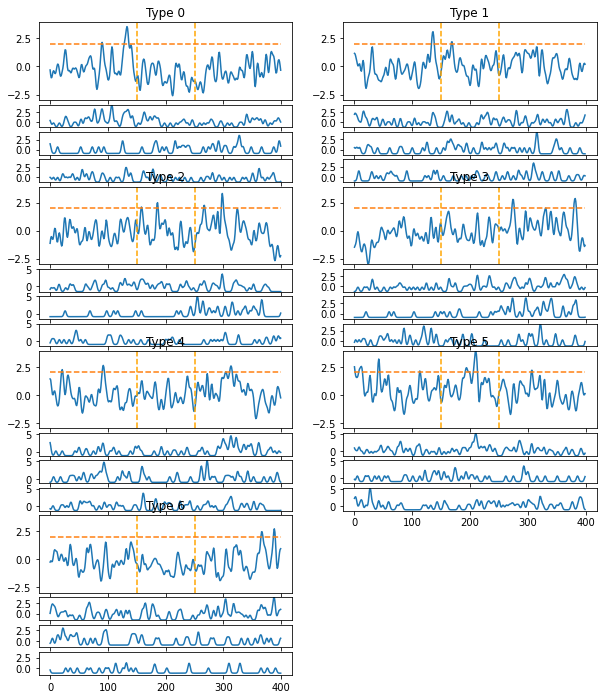

Assembly 2
Cell [19 63 62]


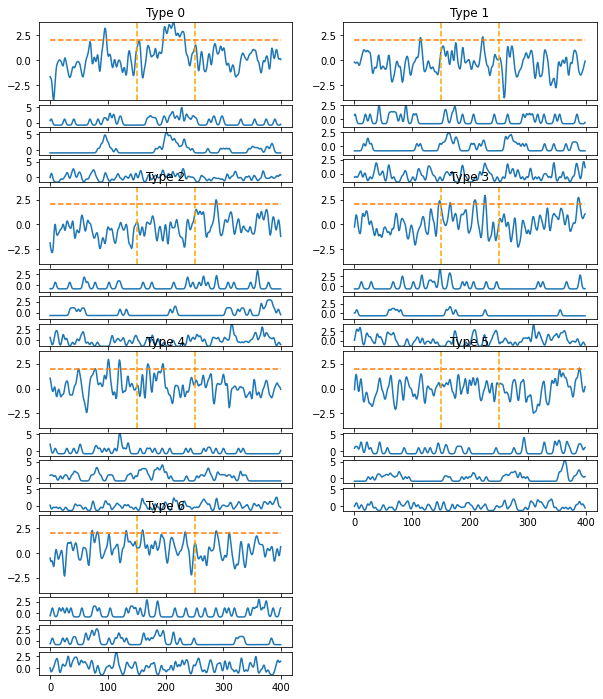

Assembly 3
Cell [159 108 146]


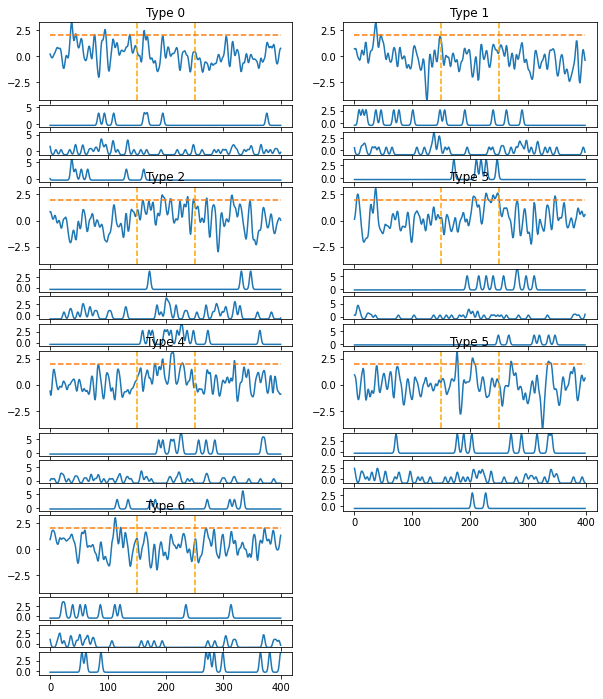

Assembly 4
Cell [4 2 3]


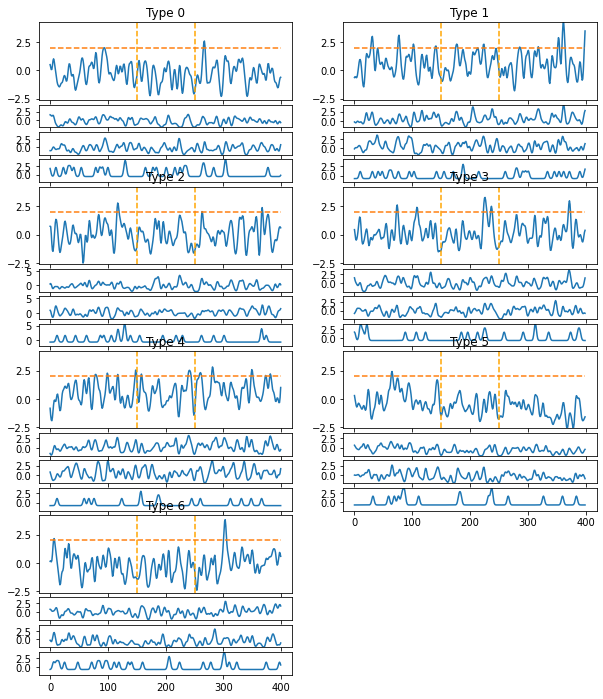

Assembly 5
Cell [125 105 131]


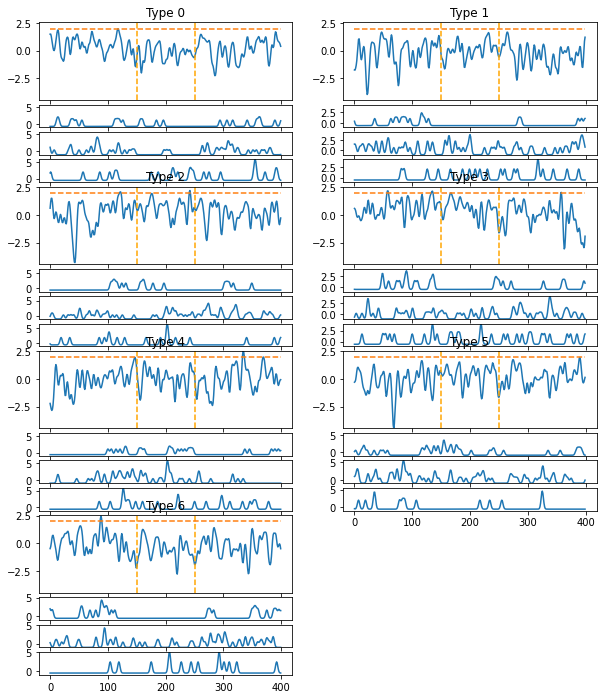

Assembly 6
Cell [148 126 133]


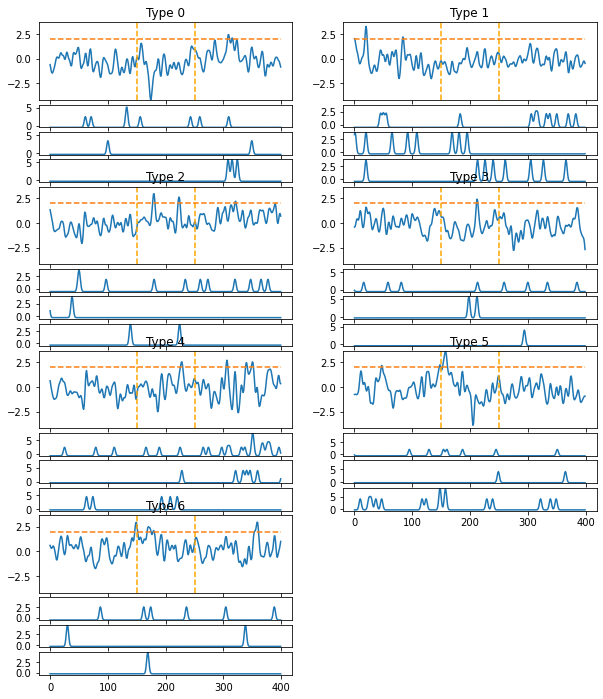

Assembly 7
Cell [19 22  0]


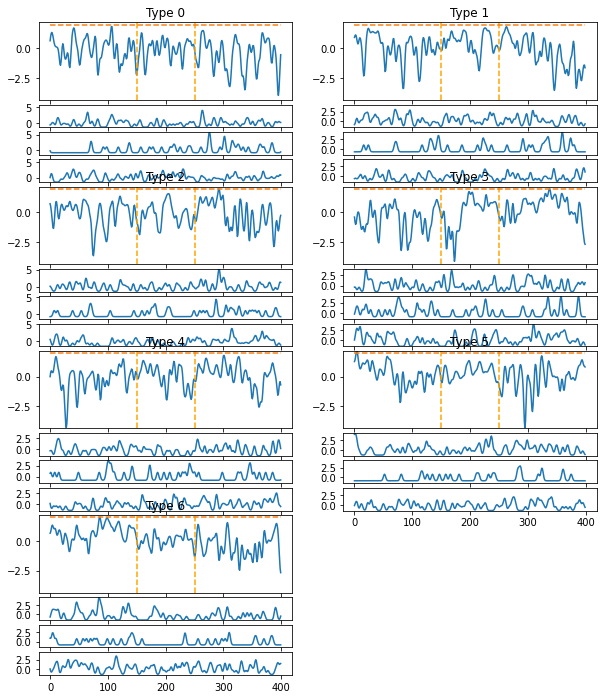

Assembly 8
Cell [102 108 115]


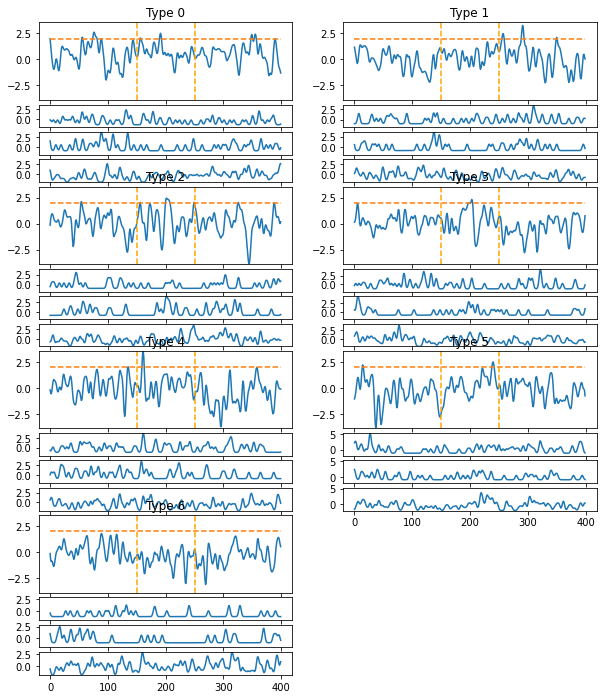

Assembly 9
Cell [108 102  97]


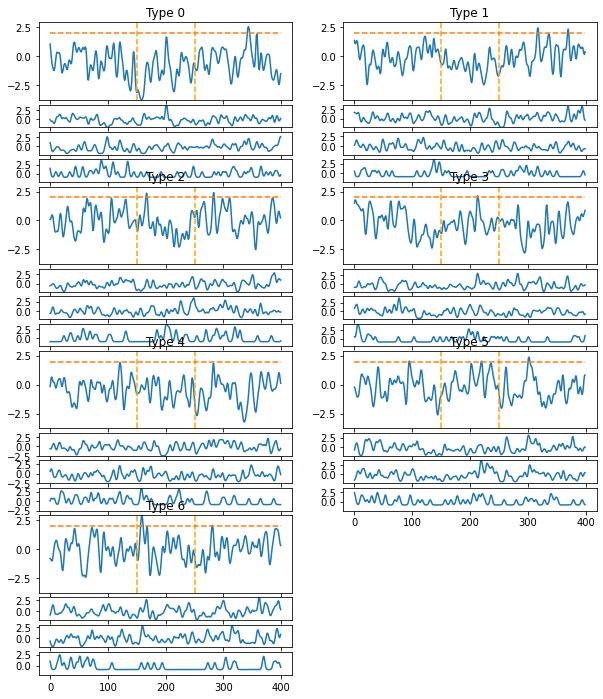

Assembly 10
Cell [63 66 57]


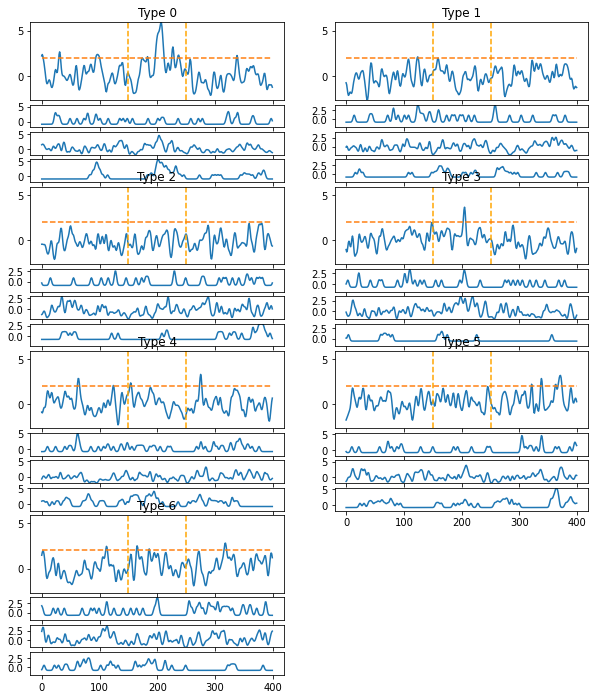

Assembly 11
Cell [  1 143 140]


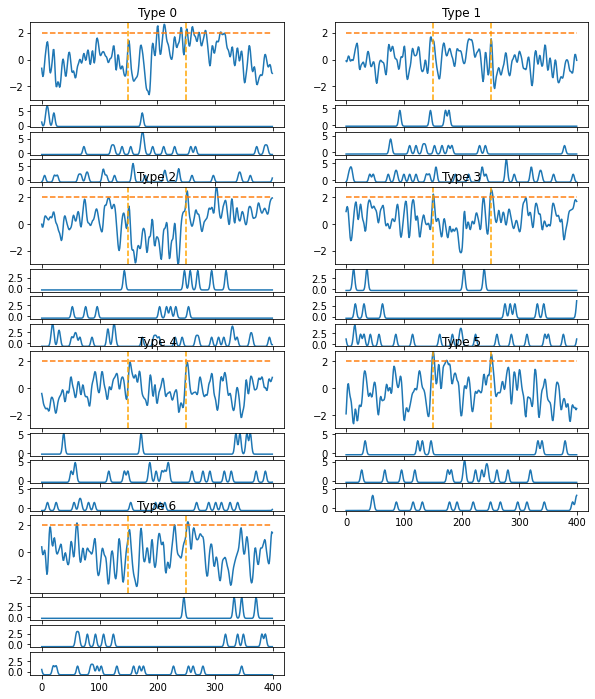

Assembly 12
Cell [68  4  1]


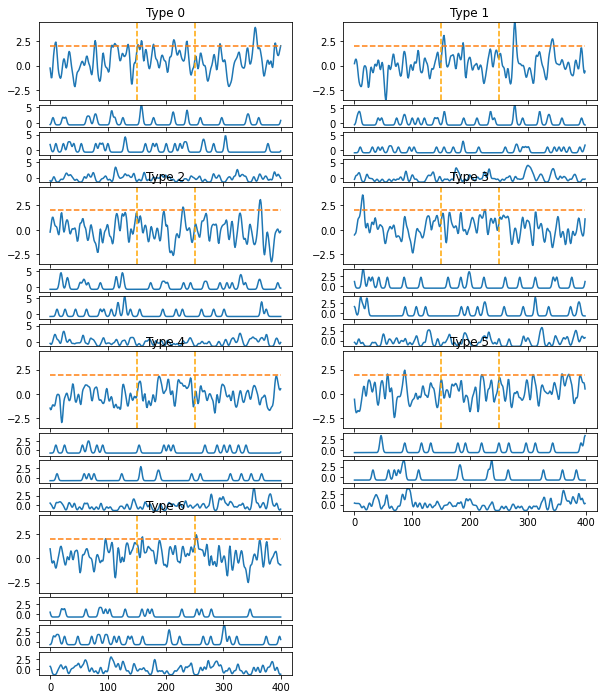

Assembly 13
Cell [131  24  17]


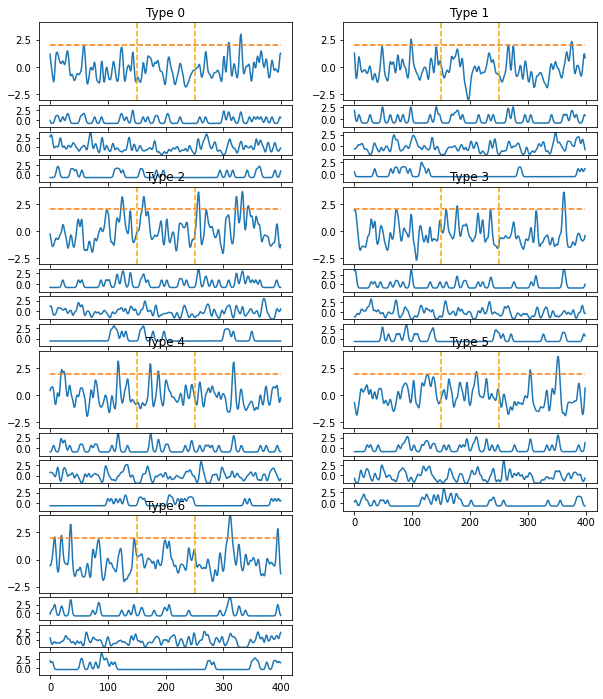

Assembly 14
Cell [19 16 24]


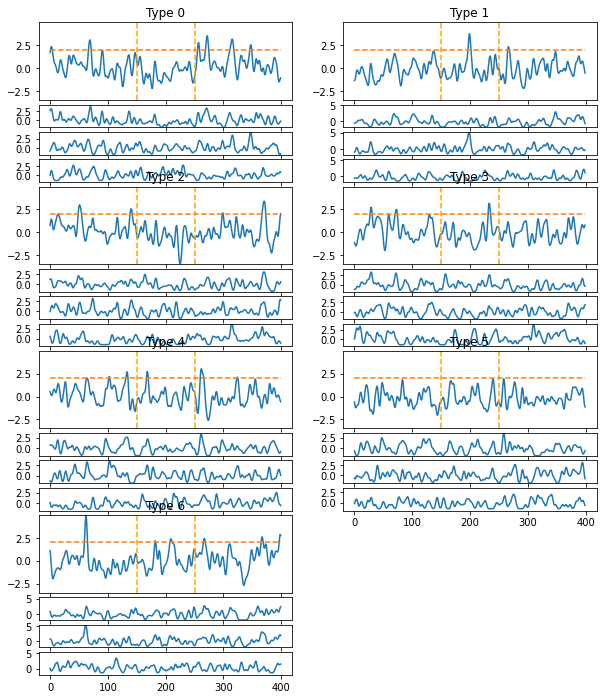

Assembly 15
Cell [111 123 107]


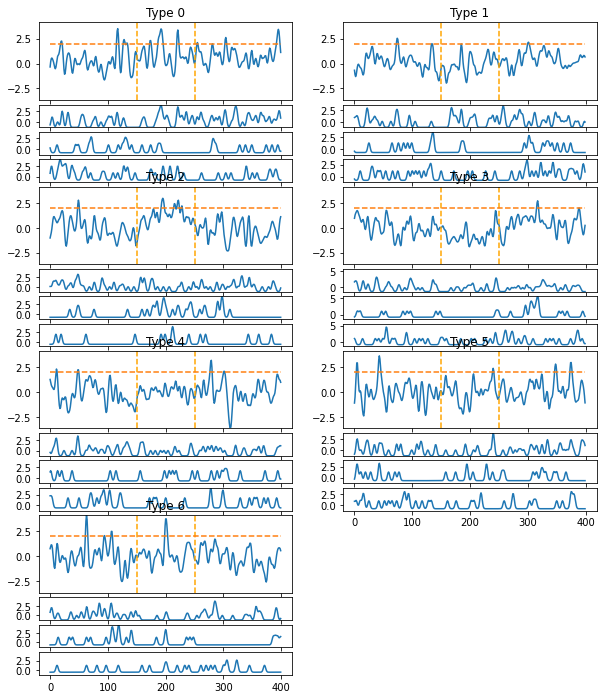

Assembly 16
Cell [74 80 71]


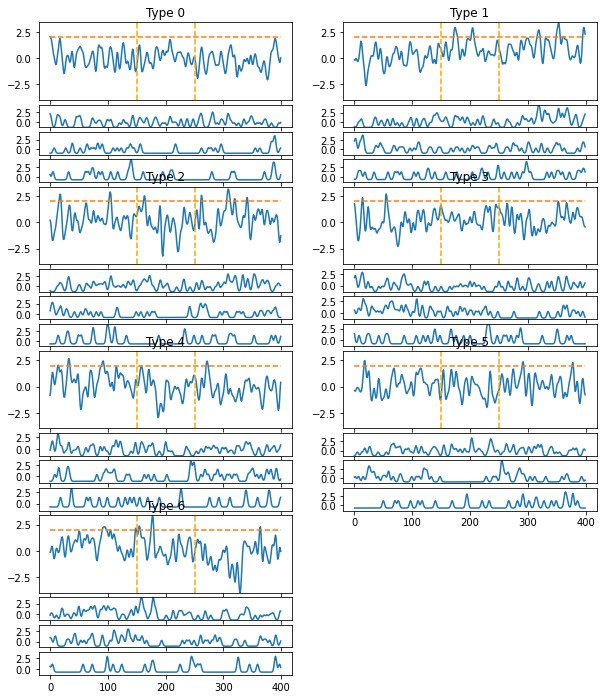

Assembly 17
Cell [143  64  70]


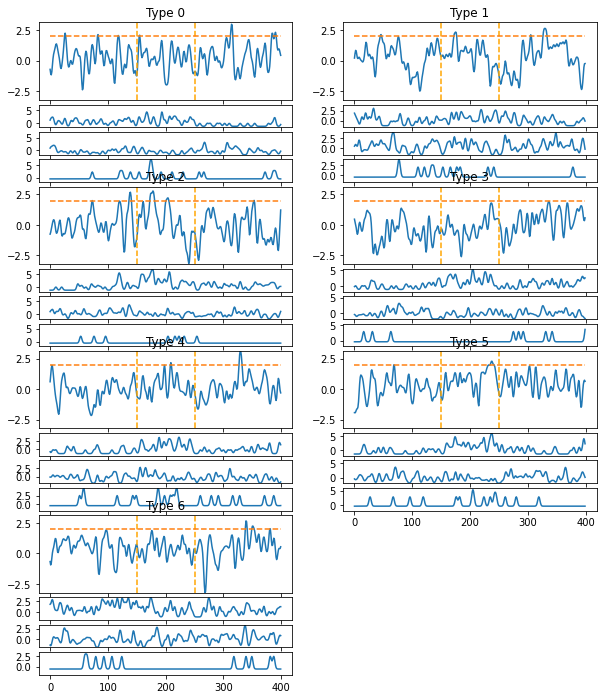

Assembly 18
Cell [135 143  70]


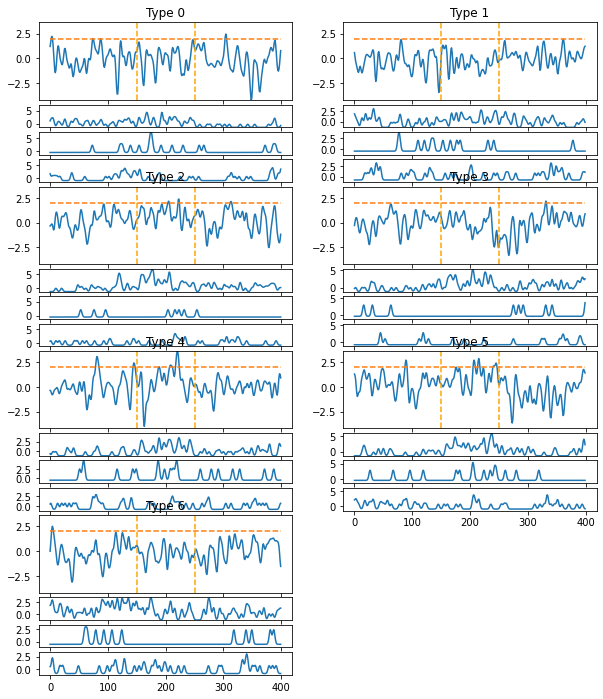

Assembly 19
Cell [ 91 133 125]


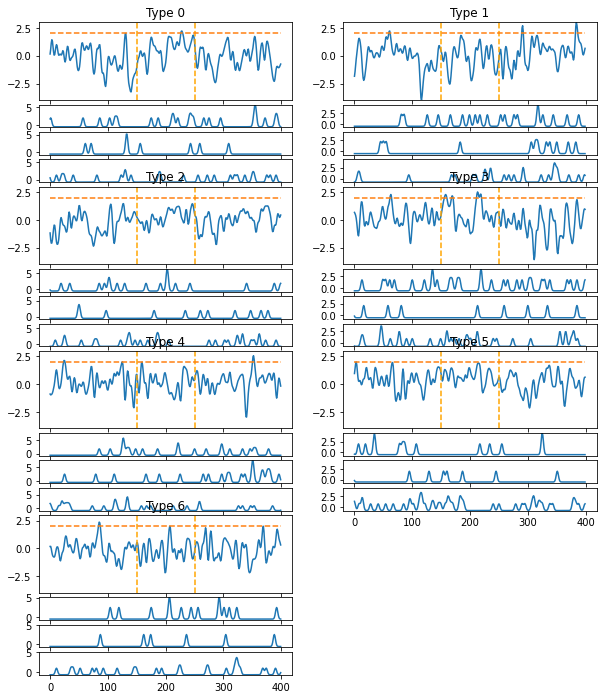

Assembly 20
Cell [75 85 82]


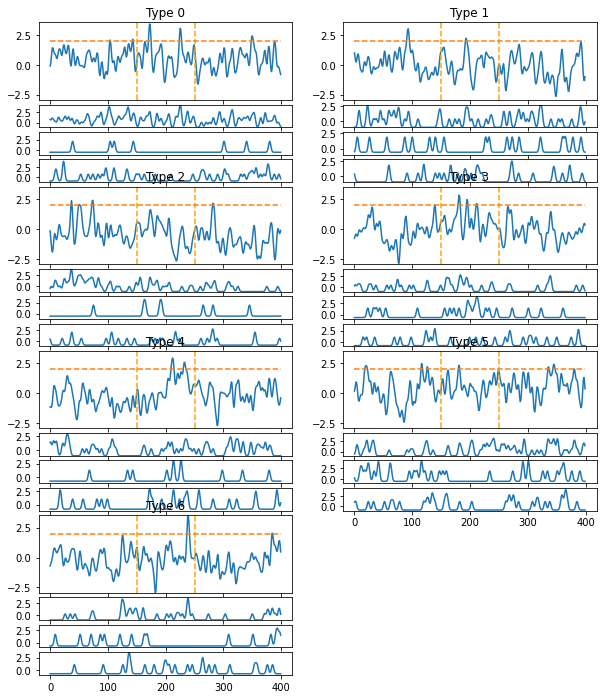

Assembly 21
Cell [101  40  76]


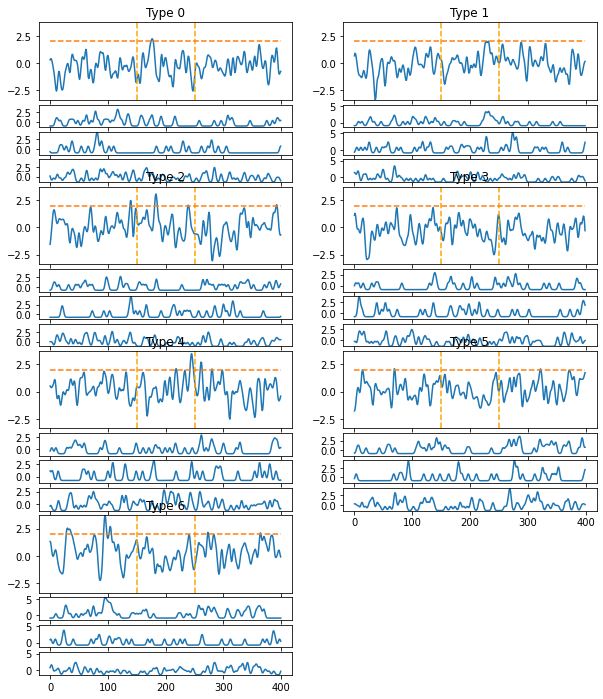

Assembly 22
Cell [66 55 61]


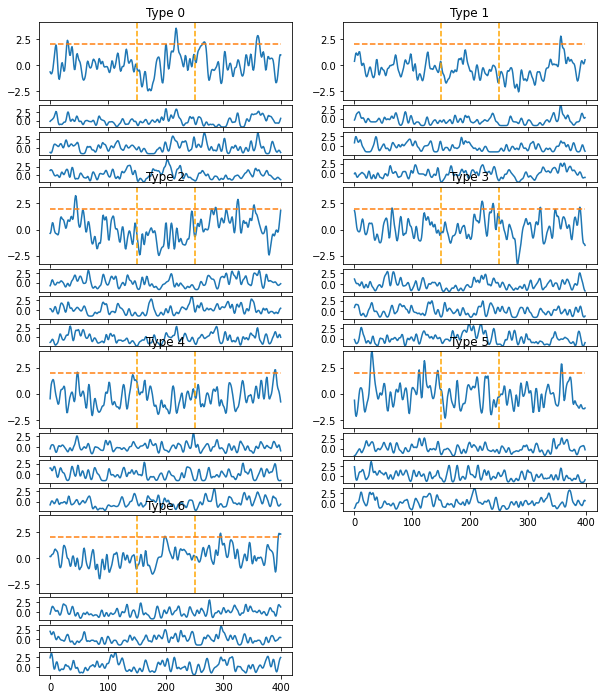

Assembly 23
Cell [95 84 85]


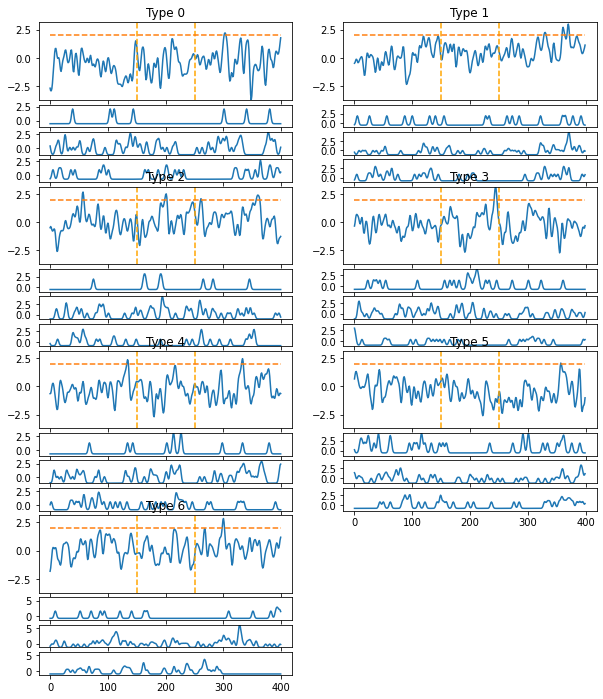

Assembly 24
Cell [15 18 34]


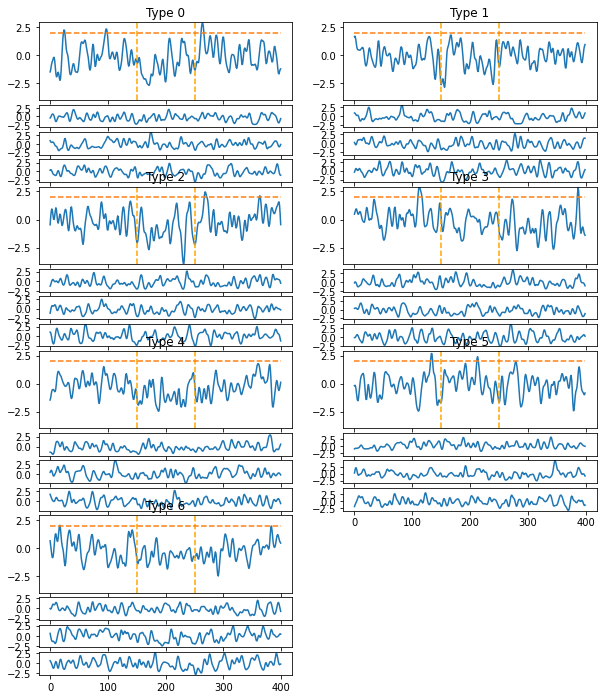

Assembly 25
Cell [67 30 31]


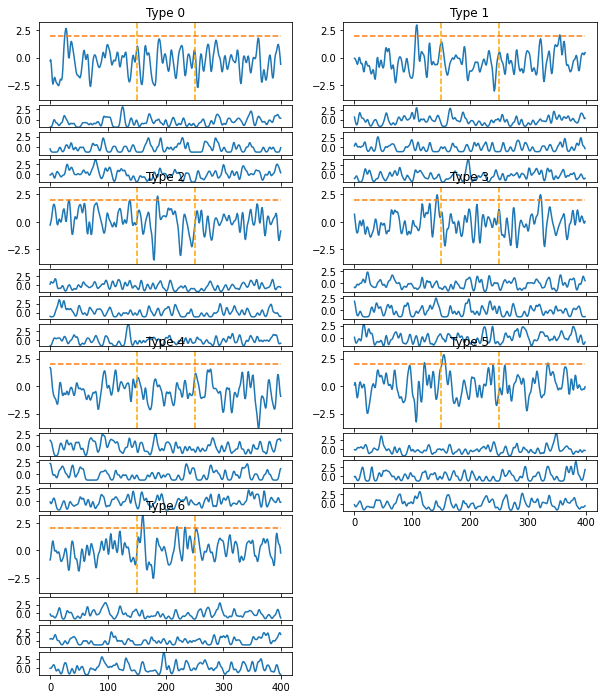

Assembly 26
Cell [46 48 39]


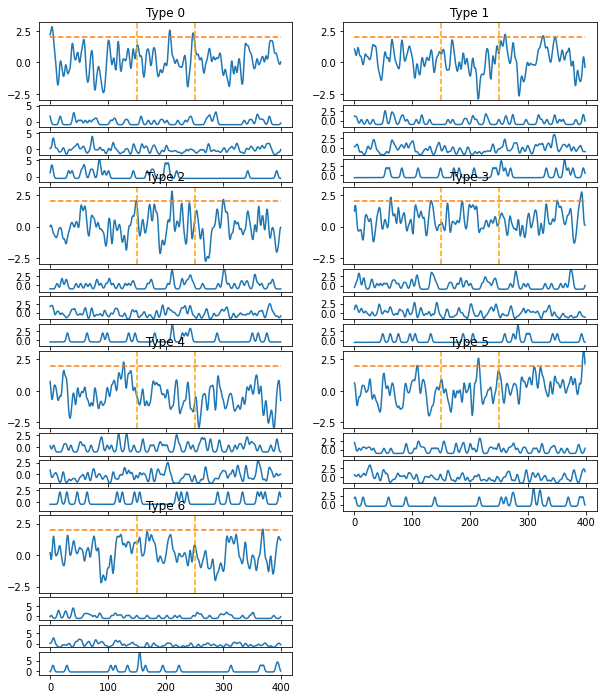

Assembly 27
Cell [ 5 75 34]


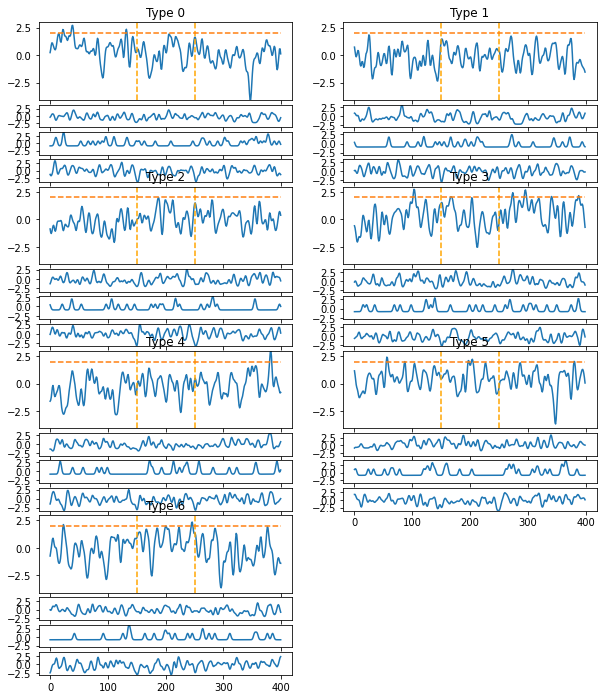

Assembly 28
Cell [145  46  29]


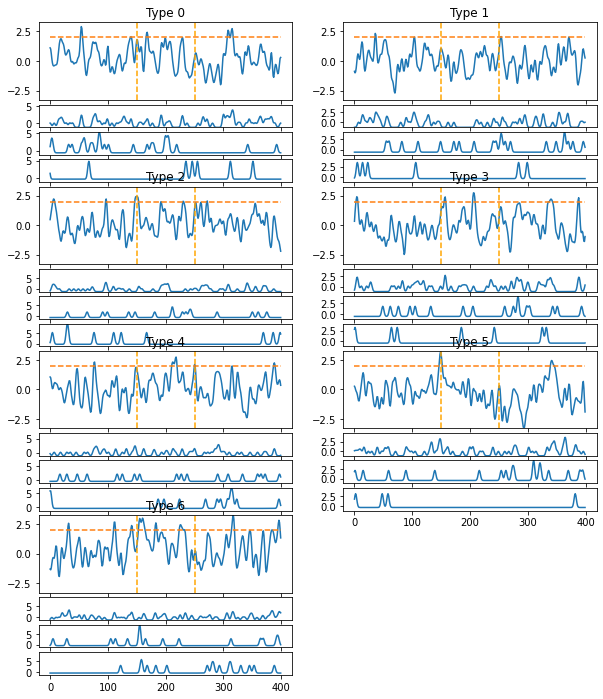

Assembly 29
Cell [ 88   1 114]


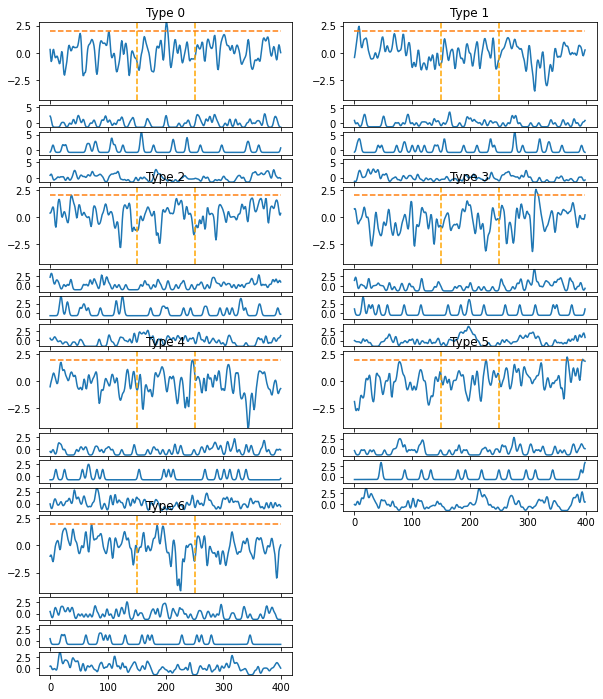

Assembly 30
Cell [145  84 111]


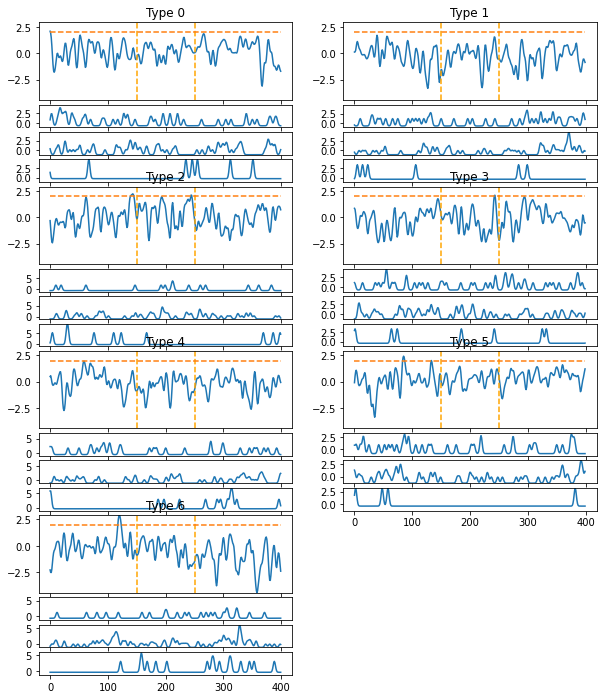

Assembly 31
Cell [108  27  22]


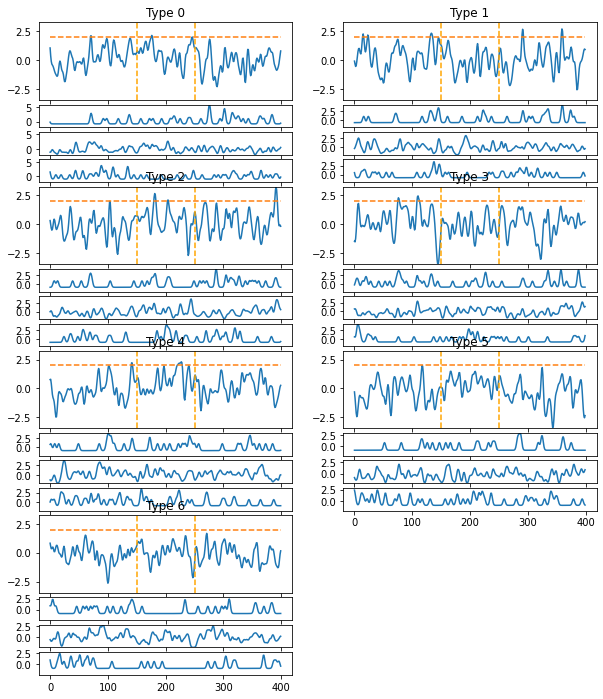

Assembly 32
Cell [132 128 137]


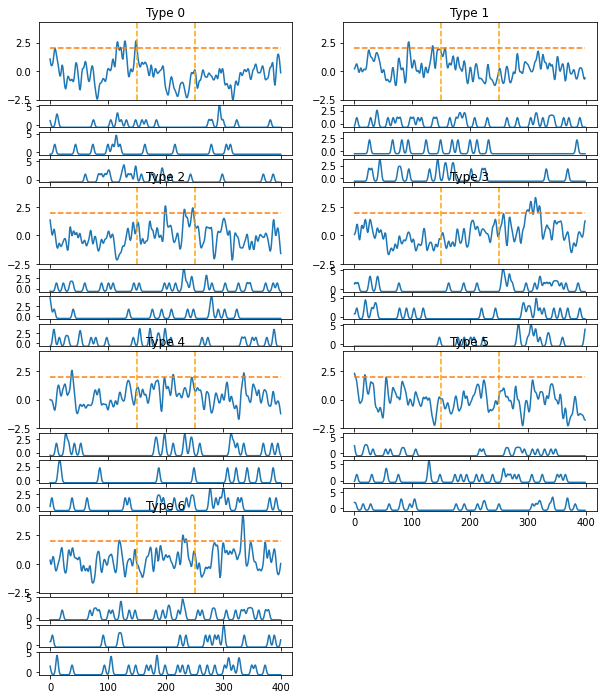

Assembly 33
Cell [ 6  8 10]


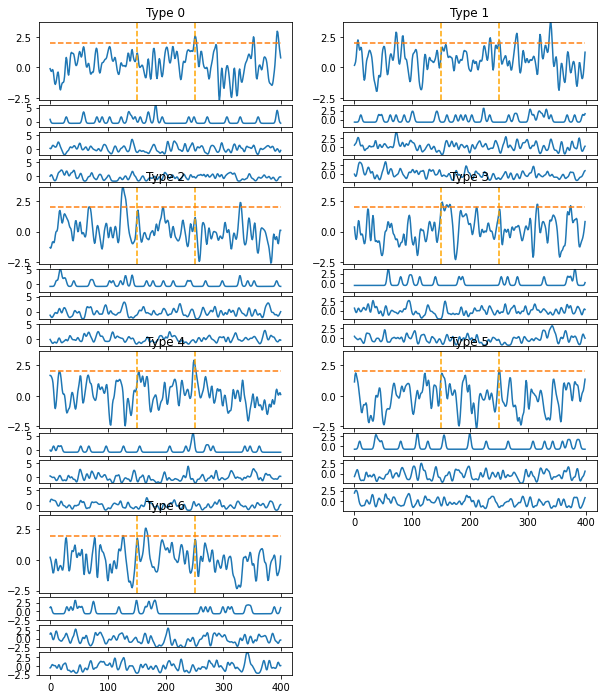

Assembly 34
Cell [146 138  40]


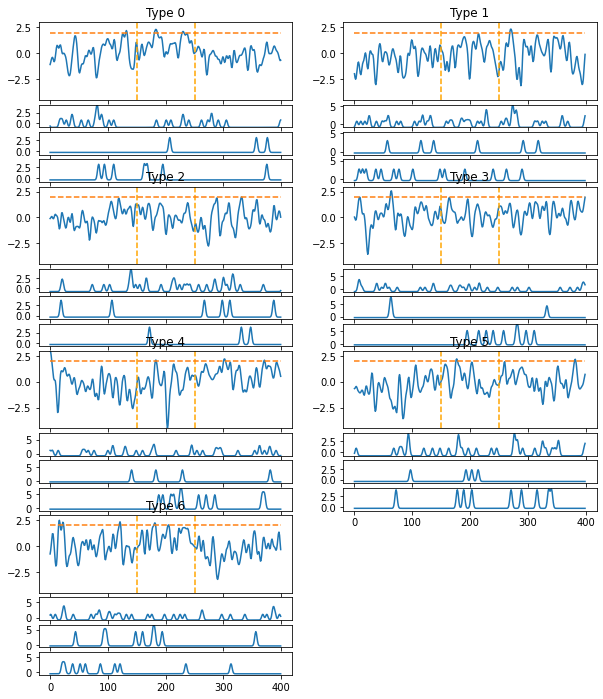

Assembly 35
Cell [39 38 36]


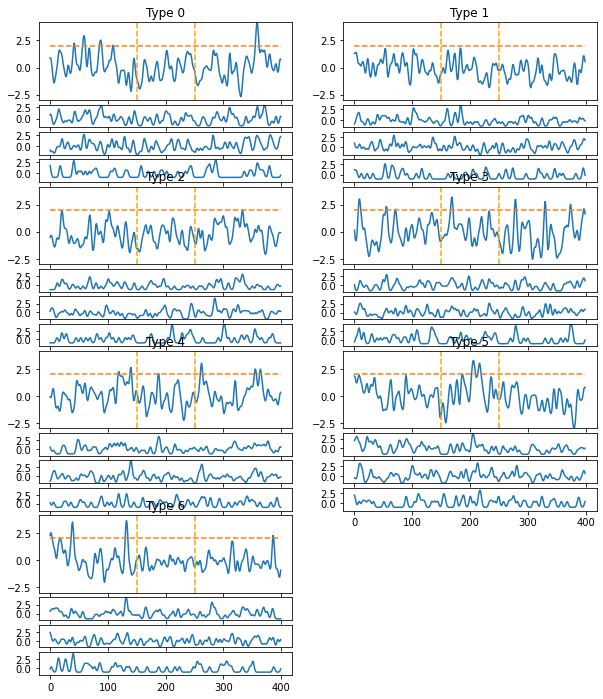

In [89]:
afore_a_strength2_s = gaussian_filter1d(afore_a_strength2, sigma=2)
stim_a_strength2_s = gaussian_filter1d(stim_a_strength2, sigma=2)
afore_cell_activity_s = gaussian_filter1d(spike_array_t[:, afore_indexs].reshape(162, 50, 7, 2000), sigma=2)
stim_spike_array_s = gaussian_filter1d(stim_spike_array, sigma=2).reshape(162, 50, 7, 2100)
stim_a_strength_s = gaussian_filter1d(assembly_strength_all2[:, stim_index], sigma=2).reshape(36, 50, 7, 2100)
assembly_cell = []
for i in range(stim_a_strength_s.shape[0]):
    pop = [[] for j in range(7)]
    maxs = [[] for j in range(7)]
    mins = [[] for j in range(7)]
    cells = [[] for j in range(7)]
    indexs = np.argsort(weight_matrix[:, i])[-3:]
    for j in range(7):
        mean = np.mean(afore_a_strength2_s[i, :, j, :])
        std = np.std(np.mean(afore_a_strength2_s[i, :, j, :], axis=0))
        pop[j] = my_zscore(np.mean(stim_a_strength2_s[i, :, j, 850:1250], axis=0), mean, std)
        maxs[j] = np.max(pop[j][150:250])
        mins[j] = np.min(pop[j][150:250])
        for k in range(3):
            mean = np.mean(afore_cell_activity_s[indexs[-k-1], :, j, :])
            std = np.std(np.mean(afore_cell_activity_s[indexs[-k-1], :, j, :], axis=0))
            cells[j].append(my_zscore(np.mean(stim_spike_array_s[indexs[-k-1], :, j, 850:1250], axis=0), mean, std))
    if max(maxs) <= 2 and min(mins) >= -2:
        continue
    
    max1 = np.max(pop[0])
    min1 = np.min(pop[0])
    max2 = np.max(pop[1])
    min2 = np.min(pop[1])
    max3 = np.max(pop[2])
    min3 = np.min(pop[2])
    max4 = np.max(pop[3])
    min4 = np.min(pop[3])
    max5 = np.max(pop[4])
    min5 = np.min(pop[4])
    max6 = np.max(pop[5])
    min6 = np.min(pop[5])
    max7 = np.max(pop[6])
    min7 = np.min(pop[6])
    
    fig = plt.figure(figsize=(10, 12))
    gs = fig.add_gridspec(4*6, 2)
    ax1 = fig.add_subplot(gs[:3, 0], )
    ax1.plot(pop[0])
#     ax1.plot(np.ones(400)*5)
    indexs = np.argsort(weight_matrix[:, i])[-3:]
#     assembly_cell.append(indexs)
    ax11 = fig.add_subplot(gs[3, 0], )
    ax11.plot(cells[0][0])
#     ax11.set_title('Cell '+str(indexs[0]))
    ax12 = fig.add_subplot(gs[4, 0], )
    ax12.plot(cells[0][1])
#     ax12.set_title('Cell '+str(indexs[1]))
    ax13 = fig.add_subplot(gs[5, 0], )
    ax13.plot(cells[0][2])
#     ax13.set_title('Cell '+str(indexs[2]))
    min11 = np.min(cells[0][0])
    max11 = np.max(cells[0][0])
    min12 = np.min(cells[0][1])
    max12 = np.max(cells[0][1])
    min13 = np.min(cells[0][2])
    max13 = np.max(cells[0][2])
    plt.setp([ax11, ax12, ax13], ylim=[min(min11, min12, min13)-0.01, max(max11, max12, max13)+0.01])
    ax1.set_title('Type 0')
    
    ax2 = fig.add_subplot(gs[:3, 1], )
    ax2.plot(pop[1])
#     ax2.plot(np.ones(400)*5)
    ax21 = fig.add_subplot(gs[3, 1], )
    ax21.plot(cells[1][0])
#     ax21.set_title('Cell '+str(indexs[0]))
    ax22 = fig.add_subplot(gs[4, 1], )
    ax22.plot(cells[1][1])
#     ax22.set_title('Cell '+str(indexs[1]))
    ax23 = fig.add_subplot(gs[5, 1], )
    ax23.plot(cells[1][2])
#     ax23.set_title('Cell '+str(indexs[2]))
    min21 = np.min(cells[1][0])
    max21 = np.max(cells[1][0])
    min22 = np.min(cells[1][1])
    max22 = np.max(cells[1][1])
    min23 = np.min(cells[1][2])
    max23 = np.max(cells[1][2])
    plt.setp([ax21, ax22, ax23], ylim=[min(min21, min22, min23)-0.01, max(max21, max22, max23)+0.01])
    ax2.set_title('Type 1')
    
    ax3 = fig.add_subplot(gs[6:9, 0], )
    ax3.plot(pop[2])
#     ax3.plot(np.ones(400)*5)
    ax31 = fig.add_subplot(gs[9, 0], )
    ax31.plot(cells[2][0])
#     ax31.set_title('Cell '+str(indexs[0]))
    ax32 = fig.add_subplot(gs[10, 0], )
    ax32.plot(cells[2][1])
#     ax32.set_title('Cell '+str(indexs[1]))
    ax33 = fig.add_subplot(gs[11, 0], )
    ax33.plot(cells[2][2])
#     ax33.set_title('Cell '+str(indexs[2]))
    min31 = np.min(cells[2][0])
    max31 = np.max(cells[2][0])
    min32 = np.min(cells[2][1])
    max32 = np.max(cells[2][1])
    min33 = np.min(cells[2][2])
    max33 = np.max(cells[2][2])
    plt.setp([ax31, ax32, ax33], ylim=[min(min31, min32, min33)-0.01, max(max31, max32, max33)+0.01])
    ax3.set_title('Type 2')
    
    ax4 = fig.add_subplot(gs[6:9, 1], )
    ax4.plot(pop[3])
#     ax4.plot(np.ones(400)*5)
    ax41 = fig.add_subplot(gs[9, 1], )
    ax41.plot(cells[3][0])
#     ax41.set_title('Cell '+str(indexs[0]))
    ax42 = fig.add_subplot(gs[10, 1], )
    ax42.plot(cells[3][1])
#     ax42.set_title('Cell '+str(indexs[1]))
    ax43 = fig.add_subplot(gs[11, 1], )
    ax43.plot(cells[3][2])
#     ax43.set_title('Cell '+str(indexs[2]))
    min41 = np.min(cells[3][0])
    max41 = np.max(cells[3][0])
    min42 = np.min(cells[3][1])
    max42 = np.max(cells[3][1])
    min43 = np.min(cells[3][2])
    max43 = np.max(cells[3][2])
    plt.setp([ax41, ax42, ax43], ylim=[min(min41, min42, min43)-0.01, max(max41, max42, max43)+0.01])
    ax4.set_title('Type 3')
    
    ax5 = fig.add_subplot(gs[12:15, 0], )
    ax5.plot(pop[4])
#     ax5.plot(np.ones(400)*5)
    ax51 = fig.add_subplot(gs[15, 0], )
    ax51.plot(cells[4][0])
#     ax51.set_title('Cell '+str(indexs[0]))
    ax52 = fig.add_subplot(gs[16, 0], )
    ax52.plot(cells[4][1])
#     ax52.set_title('Cell '+str(indexs[1]))
    ax53 = fig.add_subplot(gs[17, 0], )
    ax53.plot(cells[4][2])
#     ax53.set_title('Cell '+str(indexs[2]))
    min51 = np.min(cells[4][0])
    max51 = np.max(cells[4][0])
    min52 = np.min(cells[4][1])
    max52 = np.max(cells[4][1])
    min53 = np.min(cells[4][2])
    max53 = np.max(cells[4][2])
    plt.setp([ax51, ax52, ax53], ylim=[min(min51, min52, min53)-0.01, max(max51, max52, max53)+0.01])
    ax5.set_title('Type 4')
    
    ax6 = fig.add_subplot(gs[12:15, 1], )
    ax6.plot(pop[5])
#     ax6.plot(np.ones(400)*5)
    ax61 = fig.add_subplot(gs[15, 1],)
    ax61.plot(cells[5][0])
#     ax61.set_title('Cell '+str(indexs[0]))
    ax62 = fig.add_subplot(gs[16, 1],)
    ax62.plot(cells[5][1])
#     ax62.set_title('Cell '+str(indexs[1]))
    ax63 = fig.add_subplot(gs[17, 1],)
    ax63.plot(cells[5][2])
#     ax63.set_title('Cell '+str(indexs[2]))
    min61 = np.min(cells[5][0])
    max61 = np.max(cells[5][0])
    min62 = np.min(cells[5][1])
    max62 = np.max(cells[5][1])
    min63 = np.min(cells[5][2])
    max63 = np.max(cells[5][2])
    plt.setp([ax61, ax62, ax63], ylim=[min(min61, min62, min63)-0.01, max(max61, max62, max63)+0.01])
    ax6.set_title('Type 5')
    
    ax7 = fig.add_subplot(gs[18:21, 0], )
    ax7.plot(pop[6])
#     ax7.plot(np.ones(400)*5)
    ax71 = fig.add_subplot(gs[21, 0], )
    ax71.plot(cells[6][0])
#     ax71.set_title('Cell '+str(indexs[0]))
    ax72 = fig.add_subplot(gs[22, 0], )
    ax72.plot(cells[6][1])
#     ax72.set_title('Cell '+str(indexs[1]))
    ax73 = fig.add_subplot(gs[23, 0], )
    ax73.plot(cells[6][2])
#     ax73.set_title('Cell '+str(indexs[2]))
    min71 = np.min(cells[6][0])
    max71 = np.max(cells[6][0])
    min72 = np.min(cells[6][1])
    max72 = np.max(cells[6][1])
    min73 = np.min(cells[6][2])
    max73 = np.max(cells[6][2])
    plt.setp([ax71, ax72, ax73], ylim=[min(min71, min72, min73)-0.01, max(max71, max72, max73)+0.01])
    ax7.set_title('Type 6')
    
    plt.setp([ax1, ax2, ax3, ax4, ax5, ax6, ax7], ylim=[min(min1, min2, min3, min4, min5, min6, min7),
                                                       max(max1, max2, max3, max4, max5, max6, max7)])
    
    minn = min(min1, min2, min3, min4, min5, min6, min7)
    maxx = max(max1, max2, max3, max4, max5, max6, max7)
    
    ax1.plot(np.ones(100)*150, np.linspace(minn, maxx, 100), color='orange', linestyle='--')
    ax1.plot(np.ones(100)*250, np.linspace(minn, maxx, 100), color='orange', linestyle='--')
    ax1.plot(np.ones(400)*2, linestyle='--')
    ax2.plot(np.ones(100)*150, np.linspace(minn, maxx, 100), color='orange', linestyle='--')
    ax2.plot(np.ones(100)*250, np.linspace(minn, maxx, 100), color='orange', linestyle='--')
    ax2.plot(np.ones(400)*2, linestyle='--')
    ax3.plot(np.ones(100)*150, np.linspace(minn, maxx, 100), color='orange', linestyle='--')
    ax3.plot(np.ones(100)*250, np.linspace(minn, maxx, 100), color='orange', linestyle='--')
    ax3.plot(np.ones(400)*2, linestyle='--')
    ax4.plot(np.ones(100)*150, np.linspace(minn, maxx, 100), color='orange', linestyle='--')
    ax4.plot(np.ones(100)*250, np.linspace(minn, maxx, 100), color='orange', linestyle='--')
    ax4.plot(np.ones(400)*2, linestyle='--')
    ax5.plot(np.ones(100)*150, np.linspace(minn, maxx, 100), color='orange', linestyle='--')
    ax5.plot(np.ones(100)*250, np.linspace(minn, maxx, 100), color='orange', linestyle='--')
    ax5.plot(np.ones(400)*2, linestyle='--')
    ax6.plot(np.ones(100)*150, np.linspace(minn, maxx, 100), color='orange', linestyle='--')
    ax6.plot(np.ones(100)*250, np.linspace(minn, maxx, 100), color='orange', linestyle='--')
    ax6.plot(np.ones(400)*2, linestyle='--')
    ax7.plot(np.ones(100)*150, np.linspace(minn, maxx, 100), color='orange', linestyle='--')
    ax7.plot(np.ones(100)*250, np.linspace(minn, maxx, 100), color='orange', linestyle='--')
    ax7.plot(np.ones(400)*2, linestyle='--')
    
    plt.setp(ax1.get_xticklabels(), visible=False)
    plt.setp(ax11.get_xticklabels(), visible=False)
    plt.setp(ax12.get_xticklabels(), visible=False)
#     plt.setp(ax13.get_xticklabels(), visible=False)
    plt.setp(ax2.get_xticklabels(), visible=False)
    plt.setp(ax21.get_xticklabels(), visible=False)
    plt.setp(ax22.get_xticklabels(), visible=False)
#     plt.setp(ax23.get_xticklabels(), visible=False)
    plt.setp(ax3.get_xticklabels(), visible=False)
    plt.setp(ax31.get_xticklabels(), visible=False)
    plt.setp(ax32.get_xticklabels(), visible=False)
#     plt.setp(ax33.get_xticklabels(), visible=False)
    plt.setp(ax4.get_xticklabels(), visible=False)
    plt.setp(ax41.get_xticklabels(), visible=False)
    plt.setp(ax42.get_xticklabels(), visible=False)
#     plt.setp(ax43.get_xticklabels(), visible=False)
    plt.setp(ax5.get_xticklabels(), visible=False)
    plt.setp(ax51.get_xticklabels(), visible=False)
    plt.setp(ax52.get_xticklabels(), visible=False)
#     plt.setp(ax53.get_xticklabels(), visible=False)
    plt.setp(ax6.get_xticklabels(), visible=False)
    plt.setp(ax61.get_xticklabels(), visible=False)
    plt.setp(ax62.get_xticklabels(), visible=False)
#     plt.setp(ax63.get_xticklabels(), visible=False)
    plt.setp(ax7.get_xticklabels(), visible=False)
    plt.setp(ax71.get_xticklabels(), visible=False)
    plt.setp(ax72.get_xticklabels(), visible=False)
#     plt.setp(ax73.get_xticklabels(), visible=False)
#     plt.setp[[ax1, ax11, ax12, ax13, 
#               ax2, ax21, ax22, ax23,
#               ax3, ax31, ax32, ax33,
#               ax4, ax41, ax42, ax43,
#               ax5, ax51, ax52, ax53,
#               ax6, ax61, ax62, ax63,
#               ax7, ax71, ax72, ax73], title='Assembly '+str(i)]
    print('Assembly '+str(i))
    print('Cell', indexs)
#     plt.tight_layout()
    plt.show()

In [26]:
weight_matrix.shape, stim_spike_array.shape

((162, 35), (162, 735000))

In [ ]:
%%time
z_matrix = stats.zscore(stim_spike_array, axis=1)
assembly_strength = reactivation_strength(weight_matrix, z_matrix)

In [ ]:
assembly_strength.shape

In [ ]:
assembly_strength = assembly_strength.reshape(assembly_strength.shape[0], 50, 7, 2100)
for i in range(assembly_strength.shape[0]):
    for j in range(7):
        plt.plot(np.mean(assembly_strength[i, :, j, :].reshape(50, 2100), axis=0))
        plt.xlabel('Time(ms)')
        plt.ylabel('Assembly strength (average, z-score)')
        plt.title('Assembly '+str(i)+' stimulation type '+str(j))
        plt.show()